In [1]:
import pandas as pd
import numpy as np
import datetime as dt
from pandas import datetime
from matplotlib import pyplot as plt
import os
import calendar

from sklearn.ensemble import BaggingRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process import kernels
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import preprocessing
import math
from sklearn.metrics import mean_squared_error
import seaborn as sns

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import xgboost
from xgboost.sklearn      import XGBRegressor

import  torch
from    torch import nn
from    torch import optim
from    torch.nn import functional as F
from    torch.utils.data import TensorDataset, DataLoader
from    torch import optim
from    torch.optim import lr_scheduler

from sklearn.metrics import mean_absolute_error
plt.rcParams["figure.figsize"] = (45,20)
%matplotlib inline

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  after removing the cwd from sys.path.


In [2]:
def mda(actual: np.ndarray, predicted: np.ndarray):
    "Mean Directional Accuracy"
    return np.mean((np.sign(actual[1:] - actual[:-1]) == np.sign(predicted[1:] - predicted[:-1])))

In [3]:
energy = pd.read_csv('energy.csv')
np.where(pd.isna(energy['energy(kWh/hh)']))

(array([], dtype=int64),)

In [4]:
len(alldata['LCLid'].value_counts())

NameError: name 'alldata' is not defined

# Single household

In [4]:
alldata = pd.read_csv("hc_0.csv")
#household = "MAC000246"

df = alldata.copy()
df.reset_index(drop=True, inplace=True)
print(df.head())

   Unnamed: 0                         tstp      LCLid energy(kWh/hh)
0           0  2012-10-12 00:30:00.0000000  MAC000002             0 
1           1  2012-10-12 01:00:00.0000000  MAC000002             0 
2           2  2012-10-12 01:30:00.0000000  MAC000002             0 
3           3  2012-10-12 02:00:00.0000000  MAC000002             0 
4           4  2012-10-12 02:30:00.0000000  MAC000002             0 


In [5]:
df['tstp'] = df['tstp'].astype('datetime64[s]')

In [6]:
df.loc[:,'datetime'] = pd.to_datetime(df.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
df.loc[:,'date'] = df.loc[:,'tstp'].dt.date
df.loc[:,'month'] = df.loc[:,'datetime'].dt.month
df.loc[:,'day_of_month'] = df.loc[:,'datetime'].dt.day
df.loc[:,'time'] = df.loc[:,'datetime'].dt.time
df.loc[:,'hour'] = df.loc[:,'datetime'].dt.hour
df.loc[:,'minute'] = df.loc[:,'datetime'].dt.minute
df.loc[:,'weekday'] = df.loc[:,'datetime'].dt.weekday

In [7]:
del df['Unnamed: 0']
df

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,hour,minute,weekday
0,2012-10-12 00:30:00,MAC000002,0,2012-10-12 00:30:00,2012-10-12,10,12,00:30:00,0,30,4
1,2012-10-12 01:00:00,MAC000002,0,2012-10-12 01:00:00,2012-10-12,10,12,01:00:00,1,0,4
2,2012-10-12 01:30:00,MAC000002,0,2012-10-12 01:30:00,2012-10-12,10,12,01:30:00,1,30,4
3,2012-10-12 02:00:00,MAC000002,0,2012-10-12 02:00:00,2012-10-12,10,12,02:00:00,2,0,4
4,2012-10-12 02:30:00,MAC000002,0,2012-10-12 02:30:00,2012-10-12,10,12,02:30:00,2,30,4
...,...,...,...,...,...,...,...,...,...,...,...
1222665,2014-02-27 22:00:00,MAC005492,0.182,2014-02-27 22:00:00,2014-02-27,2,27,22:00:00,22,0,3
1222666,2014-02-27 22:30:00,MAC005492,0.122,2014-02-27 22:30:00,2014-02-27,2,27,22:30:00,22,30,3
1222667,2014-02-27 23:00:00,MAC005492,0.14,2014-02-27 23:00:00,2014-02-27,2,27,23:00:00,23,0,3
1222668,2014-02-27 23:30:00,MAC005492,0.192,2014-02-27 23:30:00,2014-02-27,2,27,23:30:00,23,30,3


In [8]:
energy.count()

Unnamed: 0        3961205
tstp              3961205
LCLid             3961205
energy(kWh/hh)    3961205
dtype: int64

In [9]:


print('Earliest date:', df.date.min())
print('Latest date:', df.date.max())



Earliest date: 2011-12-03
Latest date: 2014-02-28


In [10]:
df = df[df["energy(kWh/hh)"] != "Null"]
df.loc[:,"energy"] = df["energy(kWh/hh)"].astype("float64")

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [11]:
df['time_conv'] = df['hour'] + df['minute']/60
df['time_conv'] = df['hour'] + df['minute']/60

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [12]:
df

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,hour,minute,weekday,energy,time_conv
0,2012-10-12 00:30:00,MAC000002,0,2012-10-12 00:30:00,2012-10-12,10,12,00:30:00,0,30,4,0.000,0.5
1,2012-10-12 01:00:00,MAC000002,0,2012-10-12 01:00:00,2012-10-12,10,12,01:00:00,1,0,4,0.000,1.0
2,2012-10-12 01:30:00,MAC000002,0,2012-10-12 01:30:00,2012-10-12,10,12,01:30:00,1,30,4,0.000,1.5
3,2012-10-12 02:00:00,MAC000002,0,2012-10-12 02:00:00,2012-10-12,10,12,02:00:00,2,0,4,0.000,2.0
4,2012-10-12 02:30:00,MAC000002,0,2012-10-12 02:30:00,2012-10-12,10,12,02:30:00,2,30,4,0.000,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1222665,2014-02-27 22:00:00,MAC005492,0.182,2014-02-27 22:00:00,2014-02-27,2,27,22:00:00,22,0,3,0.182,22.0
1222666,2014-02-27 22:30:00,MAC005492,0.122,2014-02-27 22:30:00,2014-02-27,2,27,22:30:00,22,30,3,0.122,22.5
1222667,2014-02-27 23:00:00,MAC005492,0.14,2014-02-27 23:00:00,2014-02-27,2,27,23:00:00,23,0,3,0.140,23.0
1222668,2014-02-27 23:30:00,MAC005492,0.192,2014-02-27 23:30:00,2014-02-27,2,27,23:30:00,23,30,3,0.192,23.5


In [12]:
df.reset_index(inplace = True)

In [14]:
not df['time_conv'][0].is_integer()

True

In [15]:
idx = []
for i in range(len(df)):
    if i > 0:
        if not(df['time_conv'][i].is_integer()):
            df['energy'][i-1] = df['energy'][i-1] + df['energy'][i]
            idx.append(i)


C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [16]:
monday_df = df.loc[df['weekday'] == 0]

In [17]:
monday_df


,index,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,hour,minute,weekday,energy,time_conv
142,142,2012-10-15 00:00:00,MAC000002,0.192,2012-10-15 00:00:00,2012-10-15,10,15,00:00:00,0,0,0,0.192,0.5
143,143,2012-10-15 00:30:00,MAC000002,0.097,2012-10-15 00:30:00,2012-10-15,10,15,00:30:00,0,30,0,0.097,0.5
144,144,2012-10-15 01:00:00,MAC000002,0.141,2012-10-15 01:00:00,2012-10-15,10,15,01:00:00,1,0,0,0.141,2.5
145,145,2012-10-15 01:30:00,MAC000002,0.083,2012-10-15 01:30:00,2012-10-15,10,15,01:30:00,1,30,0,0.083,1.5
146,146,2012-10-15 02:00:00,MAC000002,0.132,2012-10-15 02:00:00,2012-10-15,10,15,02:00:00,2,0,0,0.132,4.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1222470,1222520,2014-02-24 21:30:00,MAC005492,0.193,2014-02-24 21:30:00,2014-02-24,2,24,21:30:00,21,30,0,0.193,21.5
1222471,1222521,2014-02-24 22:00:00,MAC005492,0.192,2014-02-24 22:00:00,2014-02-24,2,24,22:00:00,22,0,0,0.192,44.5
1222472,1222522,2014-02-24 22:30:00,MAC005492,0.297,2014-02-24 22:30:00,2014-02-24,2,24,22:30:00,22,30,0,0.297,22.5
1222473,1222523,2014-02-24 23:00:00,MAC005492,0.168,2014-02-24 23:00:00,2014-02-24,2,24,23:00:00,23,0,0,0.168,46.5


In [18]:
monday_df.reset_index(inplace = True)

In [19]:
monday_df['energy']

0         0.192
1         0.097
2         0.141
3         0.083
4         0.132
          ...  
174553    0.193
174554    0.192
174555    0.297
174556    0.168
174557    0.170
Name: energy, Length: 174558, dtype: float64

In [20]:
for i in range(len(monday_df)):
    if i>0:
        if not(monday_df['time_conv'][i].is_integer()):
            monday_df['energy'][i-1] = monday_df['energy'][i] + monday_df['energy'][i-1]

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [13]:
# FOR LATER USE
tuesday_df = df.loc[df['weekday'] == 1]
#tuesday_df.loc[:,'time'] = tuesday_df.loc[:,'datetime'].dt.time
#tuesday_df.loc[:,'hour'] = tuesday_df.loc[:,'datetime'].dt.hour
#tuesday_df.loc[:,'minute'] = tuesday_df.loc[:,'datetime'].dt.minute
wednesday_df = df.loc[df['weekday'] == 2]
thursday_df = df.loc[df['weekday'] == 3]
friday_df = df.loc[df['weekday'] == 4]
saturday_df = df.loc[df['weekday'] == 5]
sunday_df = df.loc[df['weekday'] == 6]

In [22]:
tuesday_df = tuesday_df.drop('level_0', axis = 1)

KeyError: "['level_0'] not found in axis"

In [14]:
tuesday_df.reset_index(inplace = True)
idx = []
for i in range(len(tuesday_df)):
    if i>0:
        if not(tuesday_df['time_conv'][i].is_integer()):
            tuesday_df['energy'][i-1] = tuesday_df['energy'][i] + tuesday_df['energy'][i-1]
            idx.append(i)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
wednesday_df = wednesday_df.drop('level_0', axis = 1)

In [15]:
wednesday_df.reset_index(inplace = True)
for i in range(len(wednesday_df)):
    if i>0:
        if not(wednesday_df['time_conv'][i].is_integer()):
            wednesday_df['energy'][i-1] = wednesday_df['energy'][i] + wednesday_df['energy'][i-1]        

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [24]:
sunday_df.reset_index(inplace = True)
for i in range(len(sunday_df)-1):
    if i>0:
        if not(sunday_df['time_conv'][i].is_integer()):
            sunday_df['energy'][i-1] = sunday_df['energy'][i] + sunday_df['energy'][i-1]

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


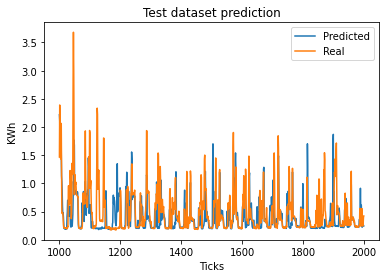

In [25]:
plt.plot(wednesday_df.index[1000:2000], wednesday_df['energy'][1000:2000], label = 'Predicted')
plt.plot(sunday_df.index[1000:2000],sunday_df['energy'][1000:2000], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

# Weather info

In [16]:
weather = pd.read_csv('weather_hourly_darksky.csv')
weather.head(4)

,visibility,windBearing,temperature,time,dewPoint,pressure,apparentTemperature,windSpeed,precipType,icon,humidity,summary
0,5.97,104,10.24,2011-11-11 00:00:00,8.86,1016.76,10.24,2.77,rain,partly-cloudy-night,0.91,Partly Cloudy
1,4.88,99,9.76,2011-11-11 01:00:00,8.83,1016.63,8.24,2.95,rain,partly-cloudy-night,0.94,Partly Cloudy
2,3.70,98,9.46,2011-11-11 02:00:00,8.79,1016.36,7.76,3.17,rain,partly-cloudy-night,0.96,Partly Cloudy
3,3.12,99,9.23,2011-11-11 03:00:00,8.63,1016.28,7.44,3.25,rain,fog,0.96,Foggy


In [17]:
weather.describe()

,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity
count,21165.000000,21165.000000,21165.000000,21165.000000,21152.000000,21165.000000,21165.000000,21165.000000
mean,11.166485,195.685897,10.471486,6.530501,1014.125153,9.230338,3.905215,0.781829
std,3.099337,90.629453,5.781904,5.041965,11.388337,6.940919,2.026854,0.140369
min,0.180000,0.000000,-5.640000,-9.980000,975.740000,-8.880000,0.040000,0.230000
25%,10.120000,121.000000,6.470000,2.820000,1007.430000,3.900000,2.420000,0.700000
50%,12.260000,217.000000,9.930000,6.570000,1014.780000,9.360000,3.680000,0.810000
75%,13.080000,256.000000,14.310000,10.330000,1022.050000,14.320000,5.070000,0.890000
max,16.090000,359.000000,32.400000,19.880000,1043.320000,32.420000,14.800000,1.000000


In [18]:
pd.to_datetime(weather['time'])
weather = weather[['temperature', 'windBearing', 'dewPoint', 'windSpeed',
       'pressure', 'visibility', 'humidity', 'apparentTemperature','time']]
weather.rename(columns = {'time':'tstp'}, inplace = True)
weather = weather.dropna()

In [19]:
pd.to_datetime(weather['tstp'])
weather['tstp'] = weather['tstp'].astype('datetime64[s]')

In [20]:
weather.loc[:,'datetime'] = pd.to_datetime(weather.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
weather.loc[:,'date'] = weather.loc[:,'tstp'].dt.date
weather.loc[:,'time'] = weather.loc[:,'datetime'].dt.time
weather.loc[:,'hour'] = weather.loc[:,'datetime'].dt.hour
weather.loc[:,'minute'] = weather.loc[:,'datetime'].dt.minute
weather.sort_values(by = ['date','time'])
del weather['date']
del weather['time']
del weather['datetime']

# Merge with single household data

In [21]:
weather_energy = wednesday_df.merge(weather,on='tstp')
weather_energy

,level_0,index,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,...,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity,apparentTemperature,hour_y,minute_y
0,238,238,2012-10-17 00:00:00,MAC000002,0.157,2012-10-17 00:00:00,2012-10-17,10,17,00:00:00,...,9.56,116,7.45,3.39,1002.09,13.10,0.87,7.76,0,0
1,39434,39435,2012-10-17 00:00:00,MAC000246,0.777,2012-10-17 00:00:00,2012-10-17,10,17,00:00:00,...,9.56,116,7.45,3.39,1002.09,13.10,0.87,7.76,0,0
2,73335,73337,2012-10-17 00:00:00,MAC000450,0.961,2012-10-17 00:00:00,2012-10-17,10,17,00:00:00,...,9.56,116,7.45,3.39,1002.09,13.10,0.87,7.76,0,0
3,91118,91121,2012-10-17 00:00:00,MAC001074,0.121,2012-10-17 00:00:00,2012-10-17,10,17,00:00:00,...,9.56,116,7.45,3.39,1002.09,13.10,0.87,7.76,0,0
4,95605,95609,2012-10-17 00:00:00,MAC003223,0.095,2012-10-17 00:00:00,2012-10-17,10,17,00:00:00,...,9.56,116,7.45,3.39,1002.09,13.10,0.87,7.76,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87697,1094939,1094985,2014-01-15 21:00:00,MAC004247,0.515,2014-01-15 21:00:00,2014-01-15,1,15,21:00:00,...,10.34,186,8.32,4.99,994.79,10.19,0.87,10.34,21,0
87698,1125834,1125881,2014-01-15 21:00:00,MAC004319,1.381,2014-01-15 21:00:00,2014-01-15,1,15,21:00:00,...,10.34,186,8.32,4.99,994.79,10.19,0.87,10.34,21,0
87699,1160071,1160119,2014-01-15 21:00:00,MAC004387,0.272,2014-01-15 21:00:00,2014-01-15,1,15,21:00:00,...,10.34,186,8.32,4.99,994.79,10.19,0.87,10.34,21,0
87700,1194070,1194119,2014-01-15 21:00:00,MAC004431,0.695,2014-01-15 21:00:00,2014-01-15,1,15,21:00:00,...,10.34,186,8.32,4.99,994.79,10.19,0.87,10.34,21,0


In [22]:
weather_energy.rename(columns = {'energy(kWh/hh)':'en_consum'}, inplace = True)

In [23]:
del weather_energy['en_consum']

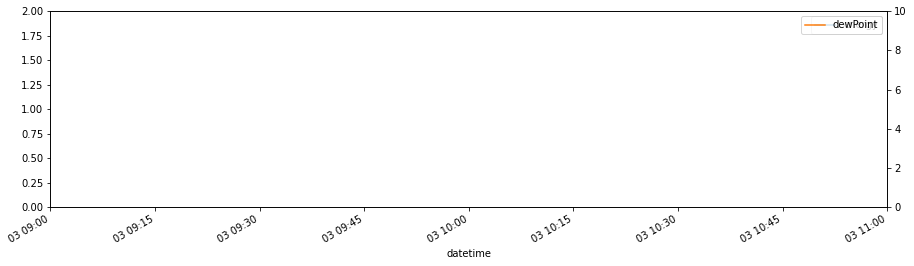

In [24]:
#FOR LATER USE!
fig, axes = plt.subplots(nrows=1, ncols=1)
weather_energy.plot(x = "datetime",y="energy", figsize=(15, 4),ylim = (0,2), xlim=('2011-12-03 09:00:00', '2011-12-03 11:00:00'), ax = axes)
axes = axes.twinx()
weather_energy.plot(x = "datetime",y=["dewPoint"], figsize=(15, 4),ylim = (0,10), xlim=('2011-12-03 09:00:00', '2011-12-03 11:00:00'), color = 'tab:orange', ax = axes)
plt.show()

In [25]:
cor_matrix = weather_energy[['energy','temperature', 'windBearing', 'dewPoint', 'windSpeed',
       'pressure', 'visibility', 'humidity']].corr()
cor_matrix

,energy,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity
energy,1.000000,-0.057386,0.007477,-0.067263,0.058678,-0.034913,0.014215,-0.010951
temperature,-0.057386,1.000000,0.041969,0.879141,0.003484,0.103658,0.291959,-0.458153
windBearing,0.007477,0.041969,1.000000,0.074914,0.108694,-0.065849,0.257208,0.034934
dewPoint,-0.067263,0.879141,0.074914,1.000000,-0.068265,0.028321,0.054177,0.014319
windSpeed,0.058678,0.003484,0.108694,-0.068265,1.000000,-0.457005,0.252178,-0.179804
pressure,-0.034913,0.103658,-0.065849,0.028321,-0.457005,1.000000,-0.003946,-0.143960
visibility,0.014215,0.291959,0.257208,0.054177,0.252178,-0.003946,1.000000,-0.549257
humidity,-0.010951,-0.458153,0.034934,0.014319,-0.179804,-0.143960,-0.549257,1.000000


# Bank holidays

In [26]:
holiday = pd.read_csv('uk_bank_holidays.csv')
holiday['Bank holidays'] = pd.to_datetime(holiday['Bank holidays']).dt.date
holiday.head(4)

,Bank holidays,Type
0,2012-12-26,Boxing Day
1,2012-12-25,Christmas Day
2,2012-08-27,Summer bank holiday
3,2012-05-06,Queen?s Diamond Jubilee (extra bank holiday)


In [27]:
weather_energy = weather_energy.merge(holiday, left_on = 'date',right_on = 'Bank holidays', how = 'left')
weather_energy['holiday_ind'] = np.where(weather_energy['Bank holidays'].isna(),0,1)

# ACORN data

In [28]:
house_info = pd.read_csv('informations_households.csv')

In [29]:
house_info

,LCLid,stdorToU,Acorn,Acorn_grouped,file
0,MAC005492,ToU,ACORN-,ACORN-,block_0
1,MAC001074,ToU,ACORN-,ACORN-,block_0
2,MAC000002,Std,ACORN-A,Affluent,block_0
3,MAC003613,Std,ACORN-A,Affluent,block_0
4,MAC003597,Std,ACORN-A,Affluent,block_0
...,...,...,...,...,...
5561,MAC002056,Std,ACORN-U,ACORN-U,block_111
5562,MAC004587,Std,ACORN-U,ACORN-U,block_111
5563,MAC004828,Std,ACORN-U,ACORN-U,block_111
5564,MAC001704,ToU,ACORN-U,ACORN-U,block_111


In [30]:
LCLids_del = house_info.loc[house_info.Acorn == 'ACORN-'].LCLid.values
LCLids_del

array(['MAC005492', 'MAC001074'], dtype=object)

In [31]:
#Delete these houses from the current block being analysed
for i in range (0,len(LCLids_del)): 
    if any(weather_energy.LCLid == LCLids_del[i]):
        weather_energy = weather_energy.loc [weather_energy.LCLid != LCLids_del[i]]
        print(i)

0
1


In [32]:
weather_energy_info = weather_energy.merge(house_info, on = 'LCLid')

In [33]:
del weather_energy_info['file']

# Adding Lags

In [34]:
weather_energy_info.drop(['hour_y','minute_y'], axis = 1, inplace = True)
weather_energy_info.rename(columns = {'hour_x':'hour'}, inplace = True)
weather_energy_info.rename(columns = {'minute_x':'minute'}, inplace = True)

In [35]:
tuesday_df.drop(index = idx,inplace = True)

C:\anaconda3\lib\site-packages\pandas\core\frame.py:4312: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [36]:
weather_energy_info['lag1'] = np.nan
weather_energy_info['lag2'] = np.nan
weather_energy_info['lag3'] = np.nan
weather_energy_info['lag4'] = np.nan
weather_energy_info['lag5'] = np.nan
weather_energy_info['lag24'] = np.nan
weather_energy_info['lag25'] = np.nan
weather_energy_info['lag26'] = np.nan
weather_energy_info['ld1'] = np.nan
weather_energy_info['ld2'] = np.nan
weather_energy_info['ld3'] = np.nan

In [37]:
uniqueValues = weather_energy_info['LCLid'].unique()

In [38]:
for i in uniqueValues:
    weather_energy_info[weather_energy_info['LCLid']== i] = weather_energy_info[weather_energy_info['LCLid']== i].sort_values('tstp')
    weather_energy_info['lag1'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 1, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag2'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 2, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag3'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 3, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag4'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 4, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag5'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 5, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag24'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 24, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag25'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 25, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['lag26'][weather_energy_info['LCLid']== i] = weather_energy_info['energy'][weather_energy_info['LCLid']== i].shift(periods = 26, fill_value=weather_energy_info['energy'][weather_energy_info['LCLid']== i].mean())
    #weather_energy_info['ld0'] = tuesday_df['energy'].values
weather_energy_info['ld0'] = np.nan
for i in uniqueValues:
    tsp = weather_energy_info[weather_energy_info['LCLid']== i]['tstp']
    for j in weather_energy_info[weather_energy_info['LCLid']== i]['tstp'].index:
        tmp = weather_energy_info[weather_energy_info['LCLid']== i]['tstp'][j]
        tmp = tmp - dt.timedelta(days=1)
        if tuesday_df['energy'][(tuesday_df['LCLid']==i) & (tuesday_df['tstp']==tmp)].values:
            weather_energy_info['ld0'][j] = tuesday_df['energy'][(tuesday_df['LCLid']==i) & (tuesday_df['tstp']==tmp)].values

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\anaconda

In [39]:
idx = np.where(weather_energy_info['ld0'].isnull())
idx = np.asarray(idx).ravel()
for i in idx:
    i_next = i
    while np.isnan(weather_energy_info['ld0'][i_next]):
        i_next = i_next + 1
        if i_next >= len(weather_energy_info):
            i_next = i_next - 1
            weather_energy_info['ld0'][i_next] = 0
    weather_energy_info['ld0'][i] = ( weather_energy_info['ld0'][i-1] +  weather_energy_info['ld0'][i_next])/2
weather_energy_info['ld0'] = weather_energy_info['ld0'].fillna(0)
for i in uniqueValues:
    weather_energy_info['ld1'][weather_energy_info['LCLid']== i] = weather_energy_info['ld0'][weather_energy_info['LCLid']== i].shift(periods = 1, fill_value=weather_energy_info['ld0'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['ld2'][weather_energy_info['LCLid']== i] = weather_energy_info['ld0'][weather_energy_info['LCLid']== i].shift(periods = 2, fill_value=weather_energy_info['ld0'][weather_energy_info['LCLid']== i].mean())
    weather_energy_info['ld3'][weather_energy_info['LCLid']== i] = weather_energy_info['ld0'][weather_energy_info['LCLid']== i].shift(periods = 3, fill_value=weather_energy_info['ld0'][weather_energy_info['LCLid']== i].mean())

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:15: Sett

In [43]:
weather_energy_info

,level_0,index,tstp,LCLid,datetime,date,month,day_of_month,time,hour,...,ld1,ld2,ld3,ld0,flag_weekend,dayofy,dayofy_x,dayofy_y,daypart,season
0,238,238,2012-10-17 00:00:00,MAC000002,2012-10-17 00:00:00,2012-10-17,10,17,0.0,0,...,0.500592,0.500592,0.500592,0.474,False,290.0,-0.961130,0.276097,night,autumn
1,240,240,2012-10-17 01:00:00,MAC000002,2012-10-17 01:00:00,2012-10-17,10,17,1.0,1,...,0.474000,0.500592,0.500592,0.311,False,290.0,-0.961130,0.276097,night,autumn
2,242,242,2012-10-17 02:00:00,MAC000002,2012-10-17 02:00:00,2012-10-17,10,17,2.0,2,...,0.311000,0.474000,0.500592,0.205,False,290.0,-0.961130,0.276097,night,autumn
3,244,244,2012-10-17 03:00:00,MAC000002,2012-10-17 03:00:00,2012-10-17,10,17,3.0,3,...,0.205000,0.311000,0.474000,0.203,False,290.0,-0.961130,0.276097,night,autumn
4,246,246,2012-10-17 04:00:00,MAC000002,2012-10-17 04:00:00,2012-10-17,10,17,4.0,4,...,0.203000,0.205000,0.311000,0.196,False,290.0,-0.961130,0.276097,night,autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85009,241161,241171,2014-02-26 19:00:00,MAC003348,2014-02-26 19:00:00,2014-02-26,2,26,19.0,19,...,0.766000,1.377000,0.392000,0.525,False,56.0,0.821477,0.570242,evening,winter
85010,241163,241173,2014-02-26 20:00:00,MAC003348,2014-02-26 20:00:00,2014-02-26,2,26,20.0,20,...,0.525000,0.766000,1.377000,0.330,False,56.0,0.821477,0.570242,evening,winter
85011,241165,241175,2014-02-26 21:00:00,MAC003348,2014-02-26 21:00:00,2014-02-26,2,26,21.0,21,...,0.330000,0.525000,0.766000,0.857,False,56.0,0.821477,0.570242,evening,winter
85012,241167,241177,2014-02-26 22:00:00,MAC003348,2014-02-26 22:00:00,2014-02-26,2,26,22.0,22,...,0.857000,0.330000,0.525000,1.371,False,56.0,0.821477,0.570242,night,winter


# Visualization

In [40]:
def get_season(date):
    Y = date.year 
    seasons = [('winter', (dt.date(Y,  1,  1),  dt.date(Y,  3, 20))),
               ('spring', (dt.date(Y,  3, 21),  dt.date(Y,  6, 20))),
               ('summer', (dt.date(Y,  6, 21),  dt.date(Y,  9, 22))),
               ('autumn', (dt.date(Y,  9, 23),  dt.date(Y, 12, 20))),
               ('winter', (dt.date(Y, 12, 21),  dt.date(Y, 12, 31)))]
    return next(season for season, (start, end) in seasons
                if start <= date <= end)


def get_day_part(hourofd):
    day_times = [('night',(0,6)), ('morning', (6,10)), ('noon', (10,14)), 
                 ('afternoon',(14,18)), ('evening', (18,22)), ('night',(22,24))]
    return next(day_time for day_time, (start, end) in day_times
                if start <= hourofd < end)
def calculate_dayofy(datetimes):
    days = datetimes.day.values 
    months = datetimes.month.values 
    years = datetimes.year.values
    dayofy = np.zeros(days.shape)
    for i in range(len(days)):
        diff = dt.date(years[i], months[i], days[i]) - dt.date(years[i], 1, 1)
        dayofy[i] = diff.days
    return dayofy

In [41]:
weather_energy_info['weekday'] = weather_energy_info.loc[:,'tstp'].dt.day_name()
weather_energy_info['flag_weekend'] = weather_energy_info.loc[:,'weekday'].replace(['Saturday', 'Sunday'], True).replace(['Monday','Tuesday','Wednesday','Thursday','Friday'],False)
weather_energy_info['dayofy'] = calculate_dayofy(weather_energy_info.loc[:,'tstp'].dt)
weather_energy_info['dayofy_x'] = np.sin(weather_energy_info['dayofy']/365*2*math.pi)
weather_energy_info['dayofy_y'] = np.cos(weather_energy_info['dayofy']/365*2*math.pi)
weather_energy['dayofy'] = calculate_dayofy(weather_energy.loc[:,'tstp'].dt)
weather_energy['dayofy_x'] = np.sin(weather_energy['dayofy']/365*2*math.pi)
weather_energy['dayofy_y'] = np.cos(weather_energy['dayofy']/365*2*math.pi)
weather_energy_info['time'] = weather_energy_info['hour'] + weather_energy_info['minute']/60
# time of day
weather_energy_info['daypart'] = [get_day_part(h) for h in weather_energy_info.time] 
# month
weather_energy_info['month'] = weather_energy_info.loc[:,'tstp'].dt.month
# season
weather_energy_info['season'] = [get_season(date) for date in weather_energy_info.date]

In [43]:
sunday_df

,index,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy
0,30,2011-12-04 00:00:00,MAC000246,0.175,2011-12-04 00:00:00,2011-12-04,12,4,00:00:00,6,0.273
1,31,2011-12-04 00:30:00,MAC000246,0.098,2011-12-04 00:30:00,2011-12-04,12,4,00:30:00,6,0.098
2,32,2011-12-04 01:00:00,MAC000246,0.144,2011-12-04 01:00:00,2011-12-04,12,4,01:00:00,6,0.209
3,33,2011-12-04 01:30:00,MAC000246,0.065,2011-12-04 01:30:00,2011-12-04,12,4,01:30:00,6,0.065
4,34,2011-12-04 02:00:00,MAC000246,0.071,2011-12-04 02:00:00,2011-12-04,12,4,02:00:00,6,0.108
...,...,...,...,...,...,...,...,...,...,...,...
5611,39047,2014-02-23 21:30:00,MAC000246,1.545,2014-02-23 21:30:00,2014-02-23,2,23,21:30:00,6,1.545
5612,39048,2014-02-23 22:00:00,MAC000246,1.226,2014-02-23 22:00:00,2014-02-23,2,23,22:00:00,6,2.218
5613,39049,2014-02-23 22:30:00,MAC000246,0.992,2014-02-23 22:30:00,2014-02-23,2,23,22:30:00,6,0.992
5614,39050,2014-02-23 23:00:00,MAC000246,0.452,2014-02-23 23:00:00,2014-02-23,2,23,23:00:00,6,0.865


In [44]:
sunday_df = sunday_df[::2]
sunday_df = sunday_df.reset_index()

In [46]:
sunday_df.loc[:,'datetime'] = pd.to_datetime(sunday_df.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
sunday_df.loc[:,'date'] = sunday_df.loc[:,'tstp'].dt.date
sunday_df.loc[:,'time'] = sunday_df.loc[:,'datetime'].dt.time
sunday_df.loc[:,'hour'] = sunday_df.loc[:,'datetime'].dt.hour
sunday_df.loc[:,'minute'] = sunday_df.loc[:,'datetime'].dt.minute
sunday_df['weekday'] = sunday_df.loc[:,'tstp'].dt.day_name()
sunday_df['flag_weekend'] = sunday_df.loc[:,'weekday'].replace(['Saturday', 'Sunday'], True).replace(['Monday','Tuesday','Wednesday','Thursday','Friday'],False)
sunday_df['dayofy'] = calculate_dayofy(sunday_df.loc[:,'tstp'].dt)
sunday_df['dayofy_x'] = np.sin(sunday_df['dayofy']/365*2*math.pi)
sunday_df['dayofy_y'] = np.cos(sunday_df['dayofy']/365*2*math.pi)
weather_energy['dayofy'] = calculate_dayofy(weather_energy.loc[:,'tstp'].dt)
weather_energy['dayofy_x'] = np.sin(weather_energy['dayofy']/365*2*math.pi)
weather_energy['dayofy_y'] = np.cos(weather_energy['dayofy']/365*2*math.pi)
sunday_df['time'] = sunday_df['hour'] + sunday_df['minute']/60
# time of day
sunday_df['daypart'] = [get_day_part(h) for h in sunday_df.time] 
# month
sunday_df['month'] = sunday_df.loc[:,'tstp'].dt.month
# season
sunday_df['season'] = [get_season(date) for date in sunday_df.date]

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


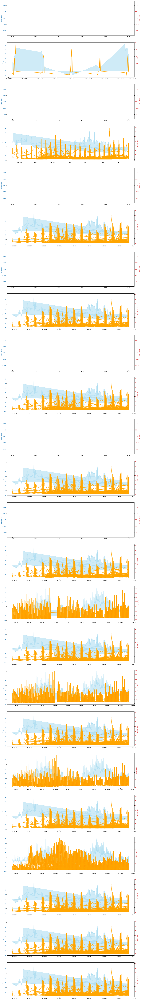

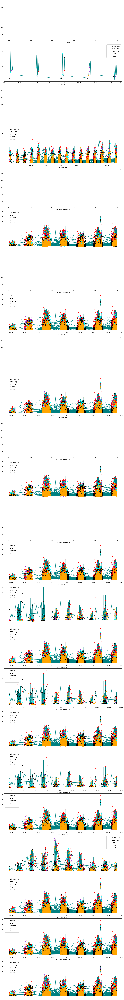

In [156]:
# plot consumption over different months
ind1 = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2012), side='left')
ind2 = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2013), side='left')
# colors
color_dict = {
  "weekday": "blue",
  "weekend": "red",
  "holiday": "green"
}
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "red",
  "night":"black"
}
fig, axs = plt.subplots(24, 1, figsize=(20,20*8))
fff, xxx = plt.subplots(24, 1, figsize=(20,20*8))

for i in np.arange(1,13):
    if not i==12:
        ind1_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=i+1,year=2012), side='left')
        df_temp = weather_energy_info.iloc[np.arange(ind1,ind1_next),:]
    else:
        ind1_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2013), side='left')
        #df_temp = sunday_df.iloc[np.arange(ind1,ind1_next),:]
    # temperature
    
    ax1 = axs[2*(i-1)]
    color = 'tab:blue'
    ax1.set_ylabel('temperature', color=color) 
    ax1.fill_between(df_temp.index, np.array(df_temp.temperature.values, dtype=float),
                 color="skyblue", alpha=0.4)
    ax1.tick_params(axis='y', labelcolor=color)
    
    # energy
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_xlabel('Sample Number')
    ax2.set_ylabel('Energy [KW]', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='orange')
    # energy color by time
    xxx[2*(i-1)].plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='teal')
    groups = df_temp.groupby('daypart')
    for name, group in groups:
        xxx[2*(i-1)].plot(group.index, group.energy, marker='o', linestyle='', ms=4, label=name, c=color_dict_dp[name])
    xxx[2*(i-1)].legend(fontsize=20)
    xxx[2*(i-1)].set_title('Sunday' + ' ' + sunday_df.date.iloc[ind1].strftime("%B") +' ' +'2013')
    
    
    
    # 2013
    if not i==12:
        ind2_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=i+1,year=2013), side='left')
        df_temp = weather_energy_info.iloc[ind2:ind2_next,:]
    else:   
        df_temp = weather_energy_info.iloc[ind2:,:]
    # temperature
    ax1 = axs[2*i-1]
    color = 'tab:blue'
    ax1.set_ylabel('temperature', color=color)  
    ax1.fill_between(df_temp.index, np.array(df_temp.temperature.values, dtype=float),
                 color="skyblue", alpha=0.4)
    ax1.tick_params(axis='y', labelcolor=color)
    # energy
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_xlabel('Sample Number')
    ax2.set_ylabel('Energy [KW]', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    # connect all with narrow line
    ax2.plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='orange')
    # energy color by time
    xxx[2*i-1].plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='teal')
    groups = df_temp.groupby('daypart')
    for name, group in groups:
        xxx[2*i-1].plot(group.index, group.energy, marker='o', linestyle='', ms=4, label=name, c=color_dict_dp[name])
    xxx[2*i-1].legend(fontsize=20)
    xxx[2*i-1].set_title('Wednesday' +' ' + weather_energy_info.date.iloc[ind1].strftime("%B") + ' '+'2013')
    
plt.tight_layout()
plt.show()

## Box plots

In [49]:
weather_energy_info

,index,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,...,ld0,ld1,ld2,ld3,flag_weekend,dayofy,dayofy_x,dayofy_y,daypart,season
0,174,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,0.0,Wednesday,0.924,...,1.519,0.78184,0.78184,0.78184,False,340.0,-0.417194,0.908818,night,autumn
1,176,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,1.0,Wednesday,1.272,...,1.381,1.51900,0.78184,0.78184,False,340.0,-0.417194,0.908818,night,autumn
2,178,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,2.0,Wednesday,0.488,...,1.365,1.38100,1.51900,0.78184,False,340.0,-0.417194,0.908818,night,autumn
3,180,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,3.0,Wednesday,0.107,...,0.262,1.36500,1.38100,1.51900,False,340.0,-0.417194,0.908818,night,autumn
4,182,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,4.0,Wednesday,0.076,...,0.211,0.26200,1.36500,1.38100,False,340.0,-0.417194,0.908818,night,autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,39186,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19.0,Wednesday,0.286,...,0.509,0.37700,0.36500,0.35600,False,56.0,0.821477,0.570242,evening,winter
2804,39188,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20.0,Wednesday,0.511,...,1.964,0.50900,0.37700,0.36500,False,56.0,0.821477,0.570242,evening,winter
2805,39190,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21.0,Wednesday,1.391,...,3.508,1.96400,0.50900,0.37700,False,56.0,0.821477,0.570242,evening,winter
2806,39192,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22.0,Wednesday,2.161,...,2.661,3.50800,1.96400,0.50900,False,56.0,0.821477,0.570242,night,winter


Text(0.5, 1.0, 'Day Parts Box Plot')

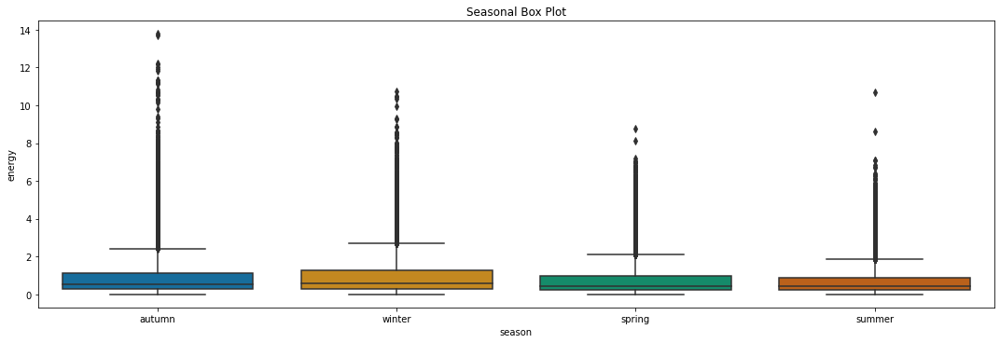

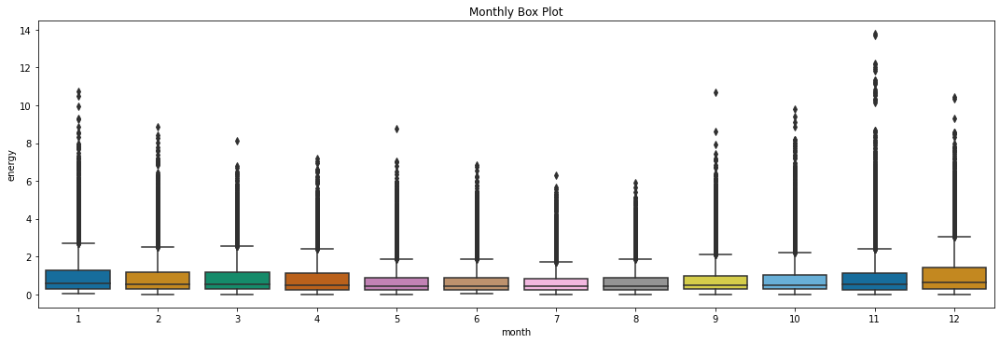

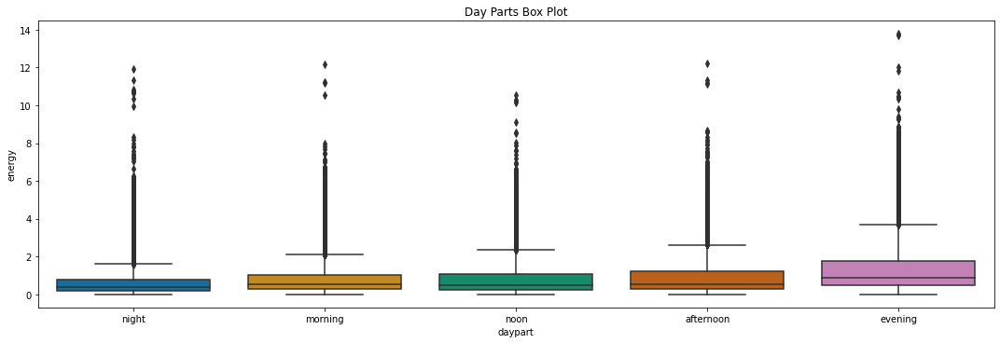

In [362]:
######


fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='season', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Seasonal Box Plot')

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='month', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Monthly Box Plot')

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='daypart', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Day Parts Box Plot')



NameError: name 'y_train' is not defined

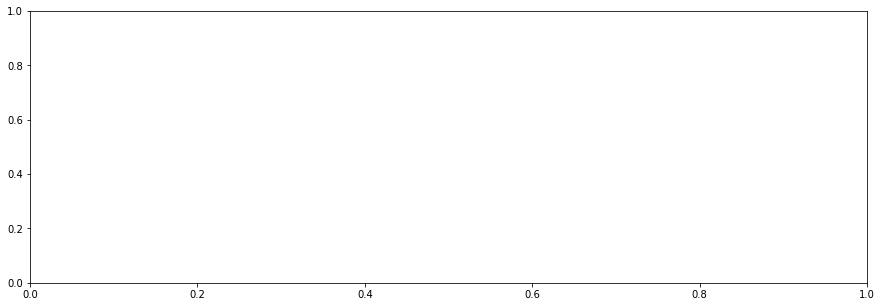

In [363]:
fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y=y_train['energy'], x='hour', data=X_train, 
            palette="colorblind", 
            ax=ax)
fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y=y_train_filt, x='hour', data=X_train_filt, 
            palette="colorblind", 
            ax=ax)

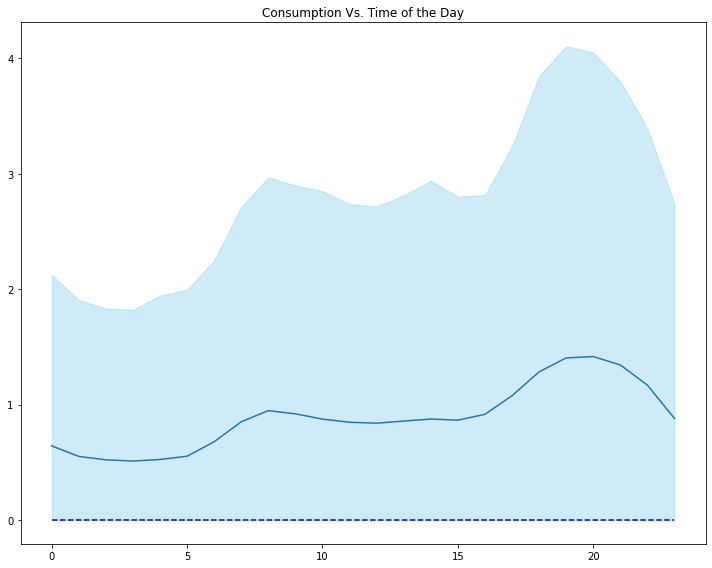

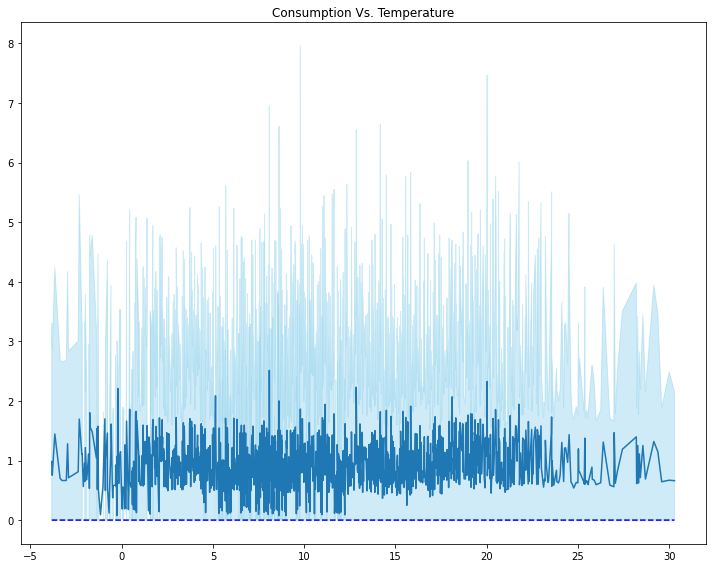

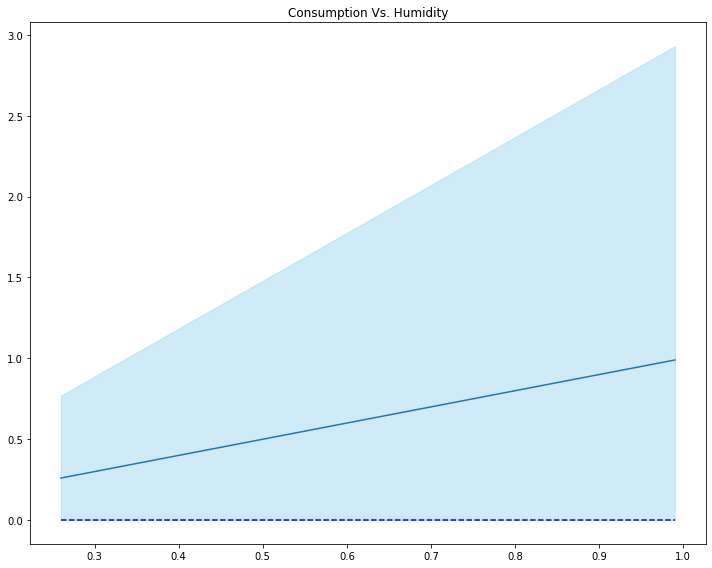

In [364]:
fig, ax = plt.subplots(1,1,figsize=(10,8))
hours = np.arange(0,24,1)
horiz_line_data = np.zeros(24)

de_temp = weather_energy_info.copy()
means = de_temp.groupby('hour', as_index=False)['energy'].mean()
means = np.array(means.energy.values, dtype=float)
stds = de_temp.groupby('hour', as_index=False)['energy'].std()
stds = np.array(stds.energy.values, dtype=float)
# plot mean
ax.plot(hours, means)
# cnof bound
ax.fill_between(hours, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(hours, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Time of the Day')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()

# temperature
fig, ax = plt.subplots(1,1,figsize=(10,8))
de_temp = weather_energy_info.copy()
means = de_temp.groupby('temperature', as_index=False)['energy'].mean()
temps = means.temperature.unique()
temps.sort()
horiz_line_data = np.zeros(len(temps))
means = np.array(means.energy.values, dtype=float)
stds = de_temp.groupby('temperature', as_index=False)['energy'].std()
stds = np.array(stds.energy.values, dtype=float)

# plot mean
ax.plot(temps, means)
# cnof bound
ax.fill_between(temps, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(temps, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Temperature')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()

# humidity
fig, ax = plt.subplots(1,1,figsize=(10,8))
de_temp = weather_energy_info.copy()
means = de_temp.groupby('humidity', as_index=False)['energy'].mean()
temps = means.humidity.unique()
temps.sort()
horiz_line_data = np.zeros(len(temps))
means = np.array(means.humidity.values, dtype=float)
stds = de_temp.groupby('humidity', as_index=False)['energy'].std()
stds = np.array(stds.humidity.values, dtype=float)

# plot mean
ax.plot(temps, means)
# cnof bound
ax.fill_between(temps, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(temps, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Humidity')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()


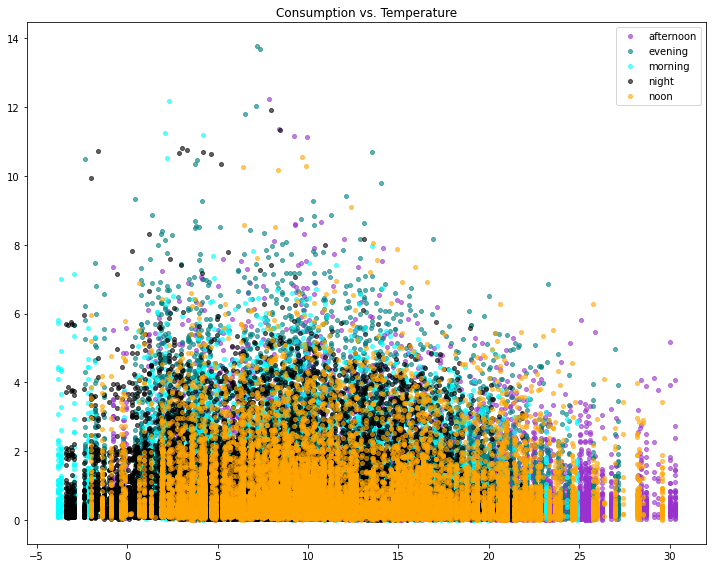

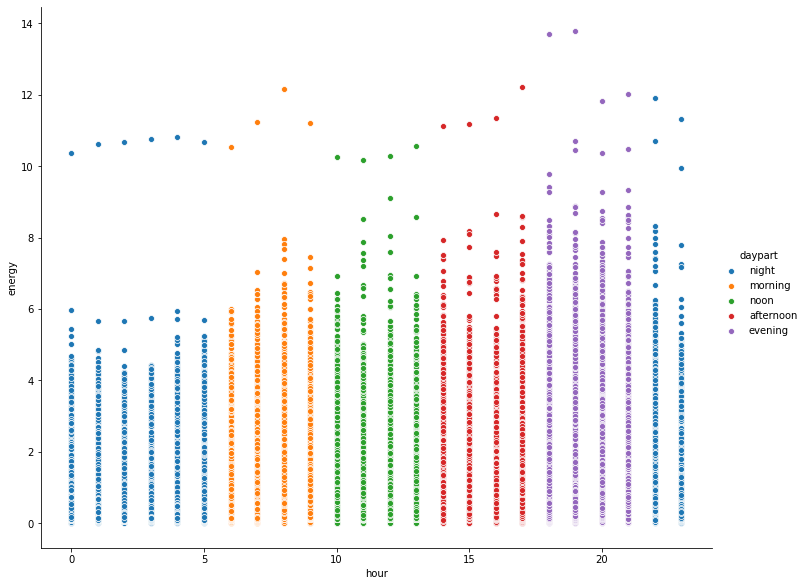

In [365]:
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
groups = weather_energy_info.groupby('daypart')
fig, ax = plt.subplots(figsize=(10,8))
for name, group in groups:
    ax.plot(group.temperature, group.energy, marker='o', 
            linestyle='', ms=4, label=name, c=color_dict_dp[name],alpha=0.6)
    ax.legend()
    ax.set_title('Consumption vs. Temperature')
               
plt.tight_layout()
plt.show()



pp = sns.pairplot(weather_energy_info[['energy', 'hour','daypart']],
                  x_vars=['hour'], y_vars=['energy'],
                  height=8, aspect=1.25, hue = "daypart")

#fig = pp.fig() 

AttributeError: 'DataFrame' object has no attribute 'day'

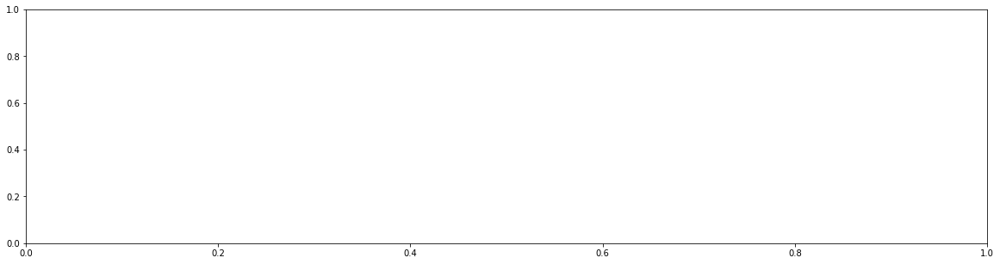

In [366]:
fig, ax1 = plt.subplots(figsize = (20,5))
ax1.plot(weather_energy.day, weather_energy.temperatureMax, color = 'tab:orange')
ax1.plot(weather_energy.day, weather_energy.temperatureMin, color = 'tab:pink')
ax1.set_ylabel('Temperature')
ax1.legend()
ax2 = ax1.twinx()
ax2.plot(weather_energy.day,weather_energy.avg_energy,color = 'tab:blue')
ax2.set_ylabel('Average Energy/Household',color = 'tab:blue')
ax2.legend(bbox_to_anchor=(0.0, 1.02, 1.0, 0.102))
plt.title('Energy Consumption and Temperature')
fig.tight_layout()
plt.show()

In [ ]:
lags = [1, 2, 48, 49, 48*7, 48*7+1]
fig, axs = plt.subplots(math.ceil(len(lags)/2), 2, figsize=(20,20))
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
for i, lag in enumerate(lags):
    #colors = [color_dict_dp[j] for j in df_1p.daypart.iloc[0:35089-lag]]
    pd.plotting.lag_plot(weather_energy_info.energy, lag=lag, ax=axs[int(i/2), int(i%2)])
    


# Cutting Outliers

In [42]:
def cut_outlier(df, target):
    df_temp = df.copy()
    target_temp = target.copy()
    df_temp['energy'] = target_temp
    df_temp['datetimes'] = df.index
    filter = pd.Series([])
    for i in range(24):
        Q1 = df_temp[df_temp['hour'] == i]['energy'].quantile(0.25)
        Q3 = df_temp[df_temp['hour'] == i]['energy'].quantile(0.75)
        IQR = Q3 - Q1    #IQR is interquartile range. 

        filter = filter.append((df_temp[df_temp['hour'] == i]['energy'] >= Q1 - 1.5 * IQR) & (df_temp[df_temp['hour'] == i]['energy'] <= Q3 + 1.5 *IQR))
    filter.sort_index(ascending=True, inplace = True)
    dummy = df_temp.copy()
    dummy1 = df_temp.copy()
    dummy2 = df_temp.copy()
    df_temp = df_temp.loc[filter]
    dummy1 = dummy2[dummy.index[-1]:]
    dummy.reset_index(inplace = True)
    frames = [dummy, dummy1]
    #df_temp = pd.concat(frames, ignore_index = True)
    df_temp.reset_index(inplace = True)
    df_temp.set_index(['datetimes'],inplace=True)
    target_temp = df_temp['energy']
    df_temp.drop(columns = 'energy', inplace = True)
    df_temp.drop(columns = ['datetime'], inplace = True)
    return df_temp, target_temp

In [388]:
Q1 = weather_energy['energy'].quantile(0.25)
Q3 = weather_energy['energy'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (weather_energy['energy'] >= Q1 - 1.5 * IQR) & (weather_energy['energy'] <= Q3 + 1.5 *IQR)
print(filter)
deleted_feat = weather_energy.loc[~filter]
weather_energy = weather_energy.loc[filter]  


0        True
1        True
2        True
3        True
4        True
        ...  
2798     True
2799    False
2800    False
2801    False
2802     True
Name: energy, Length: 2803, dtype: bool


In [142]:
weather_energy.reset_index(inplace = True)

# Splitting data based on the daypart

In [278]:
night_df = weather_energy_info.loc[weather_energy_info['daypart'] == 'night']
evening_df = weather_energy_info.loc[weather_energy_info['daypart'] == 'evening']
afternoon = weather_energy_info.loc[weather_energy_info['daypart'] == 'afternoon']
morning = weather_energy_info.loc[weather_energy_info['daypart'] == 'morning']
noon = weather_energy_info.loc[weather_energy_info['daypart'] == 'noon']

In [279]:
morning_idx = morning.reset_index()
afternoon_idx = afternoon.reset_index()
evening_idx = evening_df.reset_index()
night_idx = night_df.reset_index()
noon_idx = noon.reset_index()

# Automated Feature selection

In [176]:
weather_energy_info['hourofd_x'] = np.sin(weather_energy_info['time']/24*2*math.pi)
weather_energy_info['hourofd_y'] = np.cos(weather_energy_info['time']/24*2*math.pi)

In [226]:
features = list(set(list(weather_energy_info.columns)) - set(['energy', 'daypart', 'season', 'weekday', 'stdorToU', 'tstp', 'Acorn','Acorn_grouped', 'datetime','date', 'Bank holidays', 'Type', 'LCLid', 'hour', 'apparentTemperature']))
X = weather_energy_info.loc[:, features]
Y = weather_energy_info['energy']
KBest = SelectKBest(score_func = mutual_info_regression, k = 10)
KBest = KBest.fit(X,Y)
df_scores = pd.DataFrame({'features': X.columns, 'Mutual_info': KBest.scores_, 'pValue': KBest.pvalues_ })
df_scores

,features,Mutual_info,pValue
0,windSpeed,0.019838,None
1,temperature,0.040802,None
2,flag_weekend,0.008688,None
3,holiday_ind,0.004540,None
4,visibility,0.027276,None
5,minute,0.001992,None
6,lag1,0.120617,None
7,lag2,0.009270,None
8,dewPoint,0.024732,None
9,lag4,0.000000,None


In [287]:
features = list(set(list(weather_energy_info.columns)) - set(['energy', 'daypart', 'season', 'weekday', 'stdorToU', 'tstp', 'Acorn','Acorn_grouped', 'datetime','date', 'Bank holidays', 'Type', 'LCLid', 'hour', 'apparentTemperature']))
X = weather_energy_info.loc[:, features]
Y = weather_energy_info['energy']
KBest = SelectKBest(score_func = f_regression, k = 12)
KBest = KBest.fit(X,Y)
df_scores = pd.DataFrame({'features': X.columns, 'F_score': KBest.scores_, 'pValue': KBest.pvalues_ })
df_scores

C:\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:301: RuntimeWarning: invalid value encountered in true_divide
  corr /= X_norms


,features,F_score,pValue
0,windSpeed,6.550676,1.053651e-02
1,temperature,22.767291,1.922260e-06
2,flag_weekend,NaN,NaN
3,holiday_ind,3.358042,6.698364e-02
4,visibility,0.020013,8.875106e-01
5,minute,NaN,NaN
6,lag1,1399.731303,8.166906e-249
7,lag2,387.199609,7.611438e-81
8,dewPoint,2.658093,1.031366e-01
9,lag4,9.772407,1.789662e-03


In [288]:
cols = KBest.get_support(indices=True)
cols

array([ 1,  6,  7, 11, 12, 13, 14, 15, 16, 18, 19, 22], dtype=int64)

In [289]:
features = X.columns[cols]
features

Index(['temperature', 'lag1', 'lag2', 'dayofy_x', 'lag24', 'lag26', 'lag3',
       'humidity', 'time', 'month', 'lag25', 'dayofy_y'],
      dtype='object')

# Model construction

No handles with labels found to put in legend.
No handles with labels found to put in legend.


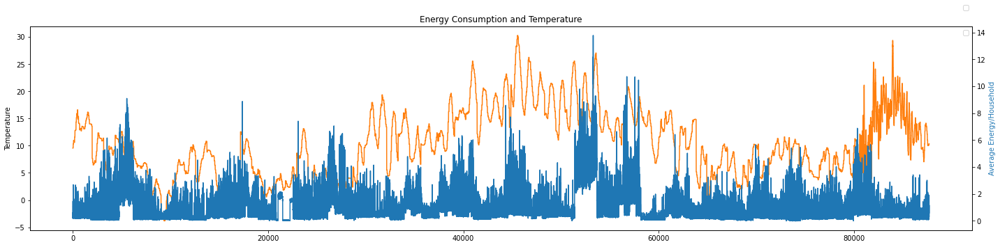

In [43]:
fig, ax1 = plt.subplots(figsize = (20,5))
ax1.plot(weather_energy.index, weather_energy.temperature, color = 'tab:orange')
ax1.set_ylabel('Temperature')
ax1.legend()
ax2 = ax1.twinx()
ax2.plot(weather_energy.index,weather_energy_info.energy,color = 'tab:blue')
ax2.set_ylabel('Average Energy/Household',color = 'tab:blue')
ax2.legend(bbox_to_anchor=(0.0, 1.02, 1.0, 0.102))
plt.title('Energy Consumption and Temperature')
fig.tight_layout()
plt.show()

In [44]:
weather_energy_info.set_index(['datetime'],inplace=True)

In [45]:
ds = []
for i in uniqueValues:
    ds.append(weather_energy_info[weather_energy_info['LCLid']== i])

In [46]:
model_data_x = []
model_data_y = []
for i in range(len(ds)):
    model_data_x.append(ds[i][['hour','minute','temperature','humidity','holiday_ind', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26','ld0', 'ld1', 'ld2', 'ld3', 'dayofy_x', 'dayofy_y', 'daypart']])
    model_data_y.append(ds[i][['energy']])



In [47]:
fraction = 0.75

In [48]:
X_train = []
y_train = []
X_test = []
y_test = []
for i in range(len(ds)):
    X_train.append(model_data_x[i][26:int(fraction*len(model_data_x[i]))])
    y_train.append(model_data_y[i][26:int(fraction*len(model_data_y[i]))])
    X_test.append(model_data_x[i][int(fraction*len(model_data_x[i])):])
    y_test.append(model_data_y[i][int(fraction*len(model_data_x[i])):])

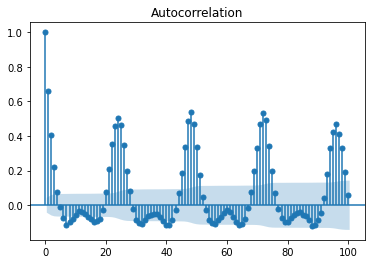

In [50]:
plot_acf(y_train[1].energy,lags=100)
plt.show()

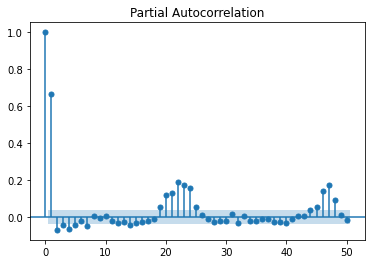

In [51]:
plot_pacf(model_data_y[1].energy,lags=50)
plt.show()

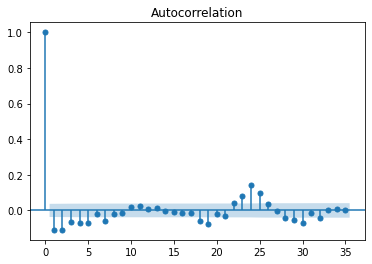

In [52]:
plot_acf(model_data_y[1].energy.diff().dropna())
plt.show()

In [49]:
for i in range(len(ds)):    
    X_train[i].index = pd.DatetimeIndex(X_train[i].index).to_period('60T')
    X_test[i].index = pd.DatetimeIndex(X_test[i].index).to_period('60T')
    y_train[i].index = pd.DatetimeIndex(y_train[i].index).to_period('60T')
    y_test[i].index = pd.DatetimeIndex(y_test[i].index).to_period('60T')

In [50]:
X_train[1]

,hour,minute,temperature,humidity,holiday_ind,month,lag1,lag2,lag3,lag4,...,lag24,lag25,lag26,ld0,ld1,ld2,ld3,dayofy_x,dayofy_y,daypart
datetime,,,,,,,,,,,,,,,,,,,,,
2011-12-14 02:00,2,0,5.92,0.78,0,12,0.508,1.709,1.194,0.320,...,0.488,1.272,0.924,0.174,0.915,1.122,1.509,-0.304921,0.952378,night
2011-12-14 03:00,3,0,5.90,0.81,0,12,1.245,0.508,1.709,1.194,...,0.107,0.488,1.272,0.151,0.174,0.915,1.122,-0.304921,0.952378,night
2011-12-14 04:00,4,0,5.75,0.81,0,12,0.128,1.245,0.508,1.709,...,0.076,0.107,0.488,0.132,0.151,0.174,0.915,-0.304921,0.952378,night
2011-12-14 05:00,5,0,5.04,0.78,0,12,0.164,0.128,1.245,0.508,...,0.107,0.076,0.107,0.077,0.132,0.151,0.174,-0.304921,0.952378,night
2011-12-14 06:00,6,0,4.16,0.84,0,12,0.169,0.164,0.128,1.245,...,0.182,0.107,0.076,0.150,0.077,0.132,0.151,-0.304921,0.952378,morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-08-07 13:00,13,0,21.44,0.46,0,8,0.612,0.768,1.557,0.123,...,0.437,0.455,0.090,0.405,1.151,0.451,0.776,-0.573772,-0.819015,noon
2013-08-07 14:00,14,0,21.49,0.47,0,8,0.540,0.612,0.768,1.557,...,0.436,0.437,0.455,0.484,0.405,1.151,0.451,-0.573772,-0.819015,afternoon
2013-08-07 15:00,15,0,21.30,0.47,0,8,0.275,0.540,0.612,0.768,...,0.511,0.436,0.437,0.884,0.484,0.405,1.151,-0.573772,-0.819015,afternoon


In [51]:
for i in range(len(ds)):   
    X_train[i]['time'] = X_train[i]['hour'] + X_train[i]['minute']/60
    X_test[i]['time'] = X_test[i]['hour'] + X_test[i]['minute']/60

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [58]:
t = sm.tsa.adfuller(model_data_y[1].energy, autolag='AIC')
pd.Series(t[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])

Test Statistic                   -5.224078
p-value                           0.000008
#Lags Used                       24.000000
Number of Observations Used    2783.000000
dtype: float64

In [52]:
for i in range(len(ds)):   
    X_train[i]['hourofd_x'] = np.sin(X_train[i]['time']/24*2*math.pi)
    X_train[i]['hourofd_y'] = np.cos(X_train[i]['time']/24*2*math.pi)
    X_test[i]['hourofd_x'] = np.sin(X_test[i]['time']/24*2*math.pi)
    X_test[i]['hourofd_y'] = np.cos(X_test[i]['time']/24*2*math.pi)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the

In [53]:
le = preprocessing.LabelEncoder()
for i in range(len(ds)): 
    X_train[i]['daypart'] = le.fit_transform(X_train[i]['daypart'])
    X_test[i]['daypart'] = le.fit_transform(X_test[i]['daypart'])
    #X_train[i] = pd.get_dummies(data=X_train[i], columns=['daypart'])
    #X_test[i] = pd.get_dummies(data=X_test[i], columns=['daypart'])

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [194]:
X_train[8]['daypart']

datetime
2012-10-10 02:00    3
2012-10-10 03:00    3
2012-10-10 04:00    3
2012-10-10 05:00    3
2012-10-10 06:00    2
                   ..
2013-10-23 07:00    2
2013-10-23 08:00    2
2013-10-23 09:00    2
2013-10-23 10:00    4
2013-10-23 11:00    4
Freq: 60T, Name: daypart, Length: 1306, dtype: int32

In [54]:
X_train_no_out = []
y_train_no_out = []
for i in range(len(ds)): 
    out_x, out_y = cut_outlier(X_train[i], y_train[i])
    X_train_no_out.append(out_x)
    y_train_no_out.append(out_y)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for em

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for em

In [55]:
model_no_out = []
output_test_no_out = []
for i in range(len(ds)): 
    x_out, y_out = cut_outlier(model_data_x[i][26:], model_data_y[i][26:])
    model_no_out.append(x_out)
    output_test_no_out.append(y_out)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for em

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for em

In [56]:
X_train_filt = []
y_train_filt = []
X_test_filt = []
y_test_filt = []
for i in range(len(ds)): 
    X_train_filt.append(model_no_out[i][:int(fraction*len(model_no_out[i]))])
    y_train_filt.append(output_test_no_out[i][:int(fraction*len(output_test_no_out[i]))])
    X_test_filt.append(model_no_out[i][int(fraction*len(model_no_out[i])):])
    y_test_filt.append(output_test_no_out[i][int(fraction*len(output_test_no_out[i])):])
for i in range(len(ds)): 
    X_train_filt[i].index = pd.DatetimeIndex(X_train_filt[i].index).to_period('60T')
    X_test_filt[i].index = pd.DatetimeIndex(X_test_filt[i].index).to_period('60T')
    y_train_filt[i].index = pd.DatetimeIndex(y_train_filt[i].index).to_period('60T')
    y_test_filt[i].index = pd.DatetimeIndex(y_test_filt[i].index).to_period('60T')

    X_train_filt[i]['time'] = X_train_filt[i]['hour'] + X_train_filt[i]['minute']/60
    X_test_filt[i]['time'] = X_test_filt[i]['hour'] + X_test_filt[i]['minute']/60

    X_train_filt[i]['hourofd_x'] = np.sin(X_train_filt[i]['time']/24*2*math.pi)
    X_train_filt[i]['hourofd_y'] = np.cos(X_train_filt[i]['time']/24*2*math.pi)

    X_test_filt[i]['hourofd_x'] = np.sin(X_test_filt[i]['time']/24*2*math.pi)
    X_test_filt[i]['hourofd_y'] = np.cos(X_test_filt[i]['time']/24*2*math.pi)

    X_train_filt[i] = pd.get_dummies(data=X_train_filt[i], columns=['daypart'])
    X_test_filt[i] = pd.get_dummies(data=X_test_filt[i], columns=['daypart'])

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

In [92]:
sc = StandardScaler()
X_train_sc = []
X_test_sc = []
for i in range(len(ds)): 
    X_train_sc.append(sc.fit_transform(X_train[i]))
    X_test_sc.append(sc.fit_transform(X_test[i]))
for i in range(len(ds)): 
    X_train[i] = pd.DataFrame(X_train_sc[i], index=X_train[i].index, columns=X_train[i].columns)
    X_test[i] = pd.DataFrame(X_test_sc[i], index=X_test[i].index, columns=X_test[i].columns)

In [196]:
X_train[1]

,hour,minute,temperature,humidity,holiday_ind,month,lag1,lag2,lag3,lag4,...,ld0,ld1,ld2,ld3,dayofy_x,dayofy_y,daypart,time,hourofd_x,hourofd_y
datetime,,,,,,,,,,,,,,,,,,,,,
2011-12-14 02:00,-1.372679,0.0,-0.795541,0.028940,-0.189358,1.845760,-0.103015,1.451982,0.784065,-0.348197,...,-0.647631,0.203657,0.441050,0.885027,-0.716128,1.326955,0.619184,-1.372679,0.704217,1.228587
2011-12-14 03:00,-1.227952,0.0,-0.798754,0.241144,-0.189358,1.845760,0.852195,-0.103932,1.451225,0.784045,...,-0.674043,-0.647429,0.203304,0.440625,-0.716128,1.326955,0.619184,-1.227952,0.997050,1.003794
2011-12-14 04:00,-1.083225,0.0,-0.822848,0.241144,-0.189358,1.845760,-0.595526,0.850863,-0.104619,1.451213,...,-0.695863,-0.673846,-0.647759,0.202922,-0.716128,1.326955,0.619184,-1.083225,1.221749,0.710838
2011-12-14 05:00,-0.938499,0.0,-0.936896,0.028940,-0.189358,1.845760,-0.548867,-0.596228,0.850133,-0.104649,...,-0.759024,-0.695669,-0.674175,-0.647986,-0.716128,1.326955,0.619184,-0.938499,1.363001,0.369684
2011-12-14 06:00,-0.793772,0.0,-1.078251,0.453349,-0.189358,1.845760,-0.542386,-0.549590,-0.596893,0.850114,...,-0.675192,-0.758840,-0.695997,-0.674397,-0.716128,1.326955,-0.124409,-0.793772,1.411179,0.003580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-08-07 13:00,0.219317,0.0,1.697449,-2.234572,-0.189358,0.654208,0.031777,0.232902,1.254316,-0.603405,...,-0.382354,0.474718,-0.329615,0.043305,-1.124763,-1.085789,1.362777,0.219317,-0.368696,-1.362739
2013-08-07 14:00,0.364044,0.0,1.705480,-2.163837,-0.189358,0.654208,-0.061541,0.030802,0.232200,1.254301,...,-0.291632,-0.382111,0.474358,-0.329900,-1.124763,-1.085789,-1.611594,0.364044,-0.709708,-1.221428
2013-08-07 15:00,0.508771,0.0,1.674960,-2.163837,-0.189358,0.654208,-0.405002,-0.062476,0.030108,0.232174,...,0.167722,-0.291374,-0.382448,0.473927,-1.124763,-1.085789,-1.611594,0.508771,-1.002541,-0.996635


#  MAML

In [57]:
def maml_gpr(kernel, X_train, y_train, tasks, X_query, y_query):
    for i in range(tasks):
        gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X_train[i], y_train[i])
        kernel = kernel.set_params(**(gpr.kernel_.get_params()))
    gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X_query, y_query)
    return gpr

In [58]:
def maml_xgb(params, X_train, y_train, tasks, X_query, y_query):
    model = XGBRegressor(**params).fit(X_train[0], y_train[0])
    for i in range(1,tasks):
        model = model.fit(X_train[i], y_train[i], xgb_model=model)
    model = XGBRegressor(**params).fit(X_query, y_query, xgb_model=model)  
    return model

In [86]:
class Meta_Learning:
    def __init__(self, model):
        self.model = model.to(device)
    
    def train_maml(self, iterations, outer_step_size, inner_step_size, 
        inner_gradient_steps, X_train, y_train, X_query, y_query, X_pred, tasks=5):
        loss = 0
        batches = 0
        for iteration in range(iterations):
            init_weights = deepcopy(self.model.state_dict())
            x_test = X_query.values
            y_test = y_query.values
            meta_params = {}
            for task in range(tasks): 
                # sample for meta-update
                x = X_train[task].values
                y = y_train[task].values
                for grad_step in range(inner_gradient_steps):
                    loss_base = self.train_loss(x,y)
                    loss_base.backward()
                    for param in self.model.parameters():
                        param.data -= inner_step_size * param.grad.data
                loss_meta = self.train_loss(x_test, y_test)
                loss_meta.backward()
                for name,param in self.model.named_parameters():
                    if(task == 0):
                        meta_params[name] =  param.grad.data
                    else:
                        meta_params[name] += param.grad.data
                loss += loss_meta.cpu().data.numpy()
                batches += 1
                self.model.load_state_dict(init_weights)
            learning_rate = outer_step_size * (1 - iteration/iterations)
            self.model.load_state_dict({name: init_weights[name] - 
                learning_rate/tasks * meta_params[name] for name in init_weights})
            if(iteration % 1000 == 0):
                pred = self.predict(X_pred.values)

    def train_reptile(self, func, k, iterations, outer_step_size, inner_step_size, 
        inner_gradient_steps):
        loss = 0
        batches=0
        for iteration in range(iterations):
            init_weights = deepcopy(self.model.state_dict())
            y_all , _ = generate(func)
            for j in range(inner_gradient_steps):
                random_order = np.random.permutation(len(x_all))
                for start in range(0,len(x_all), k):
                    indicies = random_order[start: start + k][:, None]
                    loss_base = self.train_loss(x_all[indicies], y_all[indicies])
                    loss_base.backward()
                    for param in self.model.parameters():
                        param.data -= inner_step_size * param.grad.data
                    loss += loss_base.cpu().data.numpy()
                    batches += 1
            learning_rate = outer_step_size * (1 - iteration/iterations)
            curr_weights = self.model.state_dict()
            self.model.load_state_dict({name: (init_weights[name] + learning_rate * 
                (curr_weights[name] - init_weights[name])) for name in curr_weights})
            self.writer.add_scalar('Reptile/Training/Loss/', loss/batches, iteration)
            if(iteration % 1000 == 0):
                pred = self.predict(x_all[:,None])
                for i in range(len(x_all)):
                    self.writer.add_scalars('Reptile/Training/PreTrained_Wave', 
                        {'pretrain_wave_{}'.format(iteration/1000): pred[i][0]},i)

    def train_loss(self, x, y):
        x = torch.tensor(x, dtype=torch.float32, device = device)
        y = torch.tensor(y, dtype=torch.float32, device = device)
        x = x[:, None, :]
        self.model.zero_grad()
        out = self.model(x)[0]
        loss = (out - y).pow(2).mean()
        return loss

    def eval(self, y_all, x_all, k, gradient_steps=10, inner_step_size=0.02):
        pred = [self.predict(x_all[:,None])]
        meta_weights = deepcopy(self.model.state_dict())
        for i in range(gradient_steps):
            loss_base = self.train_loss(x_all,y_all)
            loss_base.backward()
            for param in self.model.parameters():
                param.data -= inner_step_size * param.grad.data
            pred.append(self.predict(x_all[:, None]))
        loss = np.power(pred[-1] - y_all,2).mean()
        self.model.load_state_dict(meta_weights)
        return {"pred": pred, "sampled_points":(x_p, y_p)}

    def predict(self, x):
        x = torch.tensor(x, dtype=torch.float32, device=device)
        x = x[:, None, :]
        return self.model(x)[0].cpu().data.numpy()
class Meta_Wave(nn.Module):
    def __init__(self, units):
        super(Meta_Wave, self).__init__()
        self.inp = nn.Linear(24, units)
        self.layer1 = nn.Linear(units,units)
        self.out = nn.Linear(units, 1)

    def forward(self,x):
        x = torch.tanh(self.inp(x))
        x = torch.tanh(self.layer1(x))
        output = self.out(x)
        return output

In [144]:
x = torch.randn(3, 4)
x = x[:, None, :]
x.shape

torch.Size([3, 1, 4])

In [100]:
X_train_maml = []
y_train_maml = []
X_query_maml = []
y_query_maml = []
for i in range(len(ds)): 
    X_train_maml.append(X_train[i].sample(200, random_state = 0))
    y_train_maml.append(y_train[i].sample(200, random_state = 0))
    X_query_maml.append(X_train[i].sample(20, random_state = 10))
    y_query_maml.append(y_train[i].sample(20, random_state = 10))

In [199]:
kernels_gpr = kernels.RBF(length_scale = 10.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2) 


In [200]:
model = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train[35], y_train[35])
gprscore = model.score(X_train[35], y_train[35])
print(gprscore)

0.6211834375442455


In [171]:
print(model.kernel_.get_params())

{'k1': RBF(length_scale=1e-05) * DotProduct(sigma_0=1e-05), 'k2': WhiteKernel(noise_level=1e-05), 'k1__k1': RBF(length_scale=1e-05), 'k1__k2': DotProduct(sigma_0=1e-05), 'k1__k1__length_scale': 9.999999999999997e-06, 'k1__k1__length_scale_bounds': (1e-05, 100000.0), 'k1__k2__sigma_0': 9.999999999999997e-06, 'k1__k2__sigma_0_bounds': (1e-05, 100000.0), 'k2__noise_level': 9.999999999999997e-06, 'k2__noise_level_bounds': (1e-05, 100000.0)}


In [114]:
kernels_gpr = kernels.RBF(length_scale = 0.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2) 
model = maml_gpr(kernels_gpr, X_train_maml, y_train_maml, 45, X_query_maml[35], y_query_maml[35])
gprscore = model.score(X_query_maml[35], y_query_maml[35])
print(gprscore)

C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal val

C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optima

0.9999999999996374


C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)
C:\anaconda3\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal val

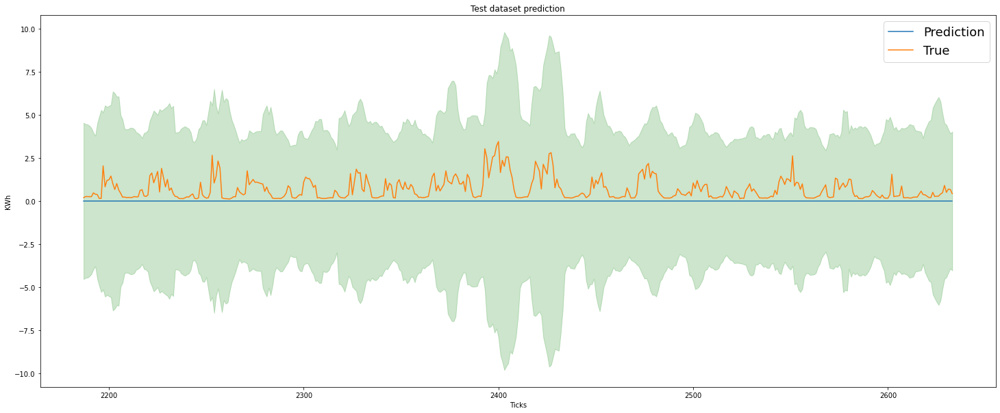

In [115]:
predictions_gpr = model.predict(X_test[35], return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.figure(figsize = (25,10))
plt.plot(weather_energy.index[2082:2511], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2082:2511],y_test[35], label = 'True')
plt.fill_between(weather_energy.index[2082:2511], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend(fontsize = 18)

In [116]:
test_score = mean_squared_error(y_test[35], predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.853


In [68]:


!pip install xgbtune



  Created wheel for xgbtune: filename=xgbtune-1.1.0-py2.py3-none-any.whl size=4856 sha256=06b8239831a810abe00f14fa1e7c8b6b31144e53ffd4b29a9418236aa15b7e66
  Stored in directory: c:\users\ffdd~1\appdata\local\pip\cache\wheels\0b\fc\d2\806972c7b07e47bc31b3714680fc8407c6a3174f49e45b19ef
Successfully built xgbtune


In [107]:
from xgbtune import tune_xgb_model

In [108]:
params = {'objective': 'reg:squarederror', 'learning_rate': 0.05}
X_train_xbg = pd.concat(X_train_maml)
y_train_xbg = pd.concat(y_train_maml)

In [109]:
params, round_count = tune_xgb_model(params, X_train_xbg, y_train_xbg)

tuning pass 0...
computing best round...
best round: 229
tuning max_depth and min_child_weight ...
best loss: 0.1498
best max_depth: 8
best min_child_weight: 1
tuning gamma ...
best loss: 0.1498
best gamma: 0.0
re-computing best round...
best round: 229
tuning subsample and colsample_bytree ...
best loss: 0.1345
best subsample: 0.9
best colsample_bytree: 1.0
fine tuning subsample and colsample_bytree ...
best loss: 0.1345
best subsample: 0.9
best colsample_bytree: 1.0
tuning alpha and lambda ...
best loss: 0.1345
best alpha: 0
best lambda: 1
tuning seed ...
best loss: 0.1327
best seed: 13
{'objective': 'reg:squarederror', 'learning_rate': 0.05, 'max_depth': 8, 'min_child_weight': 1, 'gamma': 0.0, 'subsample': 0.9, 'colsample_bytree': 1.0, 'alpha': 0, 'lambda': 1, 'seed': 13}
tuning pass 1...
computing best round...
best round: 323
tuning max_depth and min_child_weight ...
best loss: 0.0947
best max_depth: 8
best min_child_weight: 1
tuning gamma ...
best loss: 0.0947
best gamma: 0.0
re-

In [110]:
model = maml_xgb(params, X_train_maml, y_train_maml, 45, X_query_maml[35], y_query_maml[35])

In [111]:
pred_xg = model.predict(X_test[35])
for i in range(len(pred_xg)):
    if pred_xg[i] < 0:
        pred_xg[i] = 0

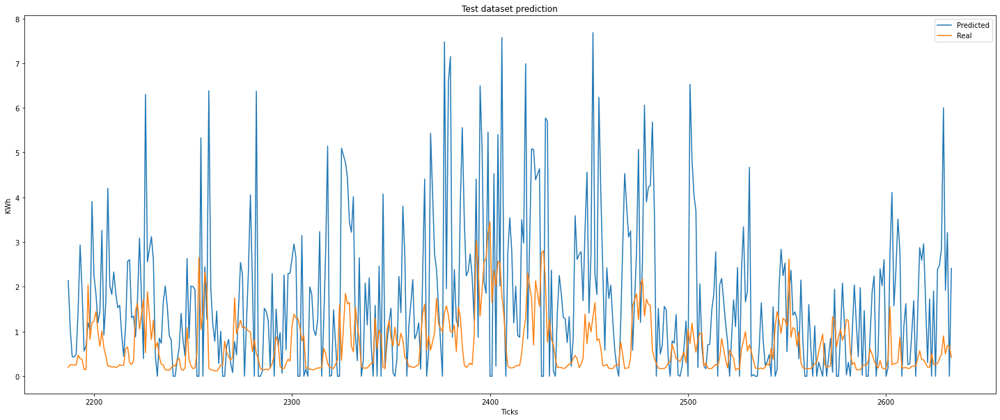

In [112]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2082:2511], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2082:2511],y_test[35], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [113]:
test_score = mean_squared_error(y_test[35], pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 3.701


In [61]:

device = ('cuda' if torch.cuda.is_available() else 'cpu')
from copy import deepcopy

In [101]:
#model = Meta_Wave(128)
model = nn.LSTM(24,1)
meta = Meta_Learning(model)
meta.train_maml(1000, 0.1, 0.02,
    1, X_train_maml, y_train_maml, X_query_maml[35], y_query_maml[35], X_test[35])
learner = 'maml'

In [102]:
pred = meta.predict(X_test[35].values)

In [103]:
pred = pred.flatten()

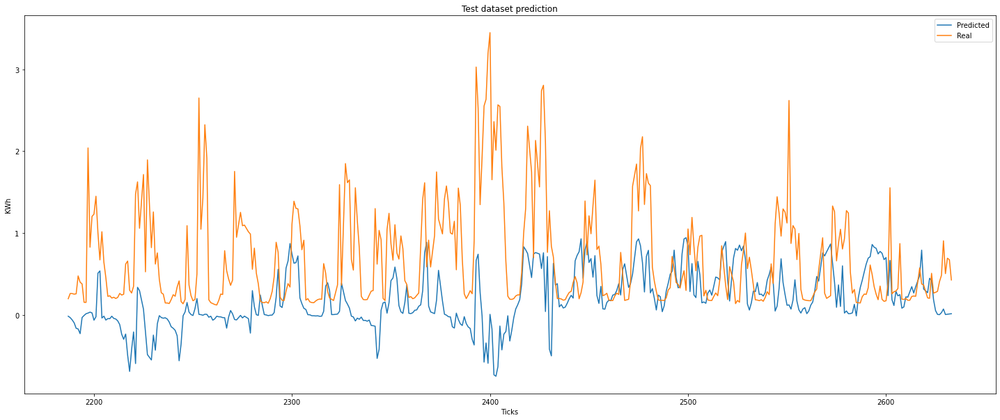

In [104]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2082:2511], pred, label = 'Predicted')
plt.plot(weather_energy.index[2082:2511],y_test[35], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [105]:
test_score = mean_squared_error(y_test[35], pred)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.744


## SVR 

In [123]:
svr_fit = svm.NuSVR(kernel='poly', degree = 3,C = 100, nu = 0.7).fit(X_train[1], y_train[1])
svrscore = svr_fit.score(X_train[1], y_train[1])
print(svrscore)

C:\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.9178153271748133


ValueError: x and y must have same first dimension, but have shapes (562,) and (702,)

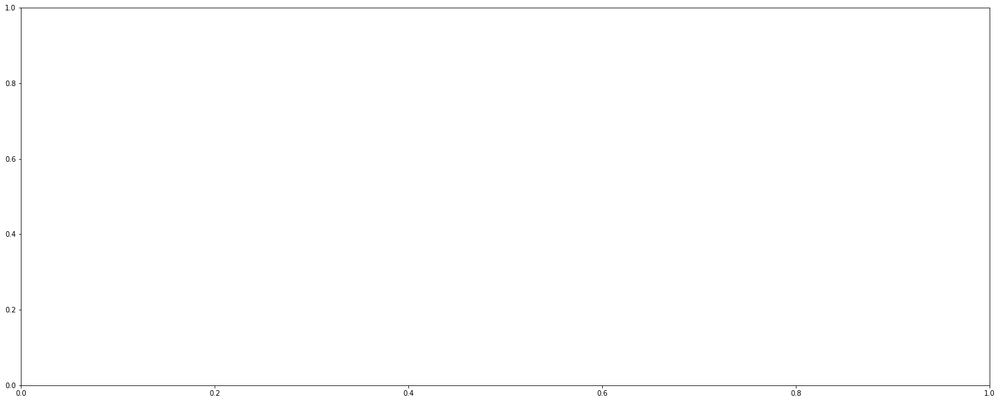

In [125]:
predictions_svr = svr_fit.predict(X_test[1])
plt.plot(weather_energy.index[2085:2647], predictions_svr, label = 'Predicted')
plt.plot(weather_energy.index[2085:2647],y_test[1], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

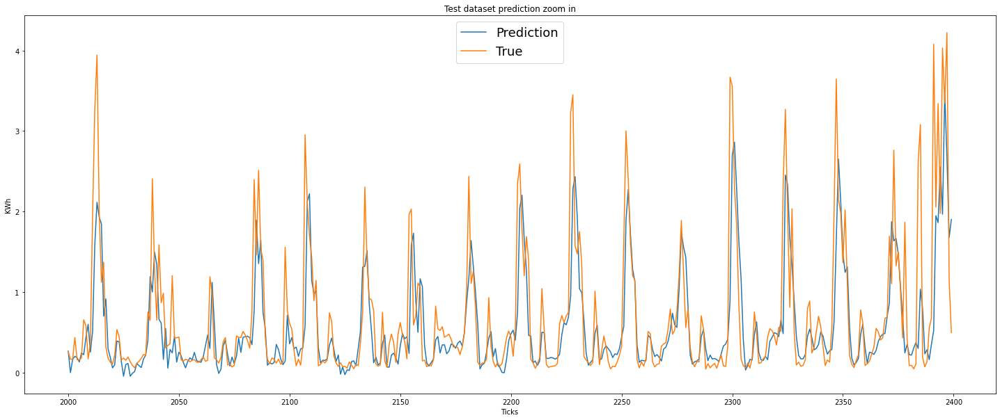

In [140]:
plt.plot(weather_energy.index[2000:2400], predictions_svr[:400], label = 'Prediction')
plt.plot(weather_energy.index[2000:2400],y_test[:400], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend(fontsize = 18, loc = 0)

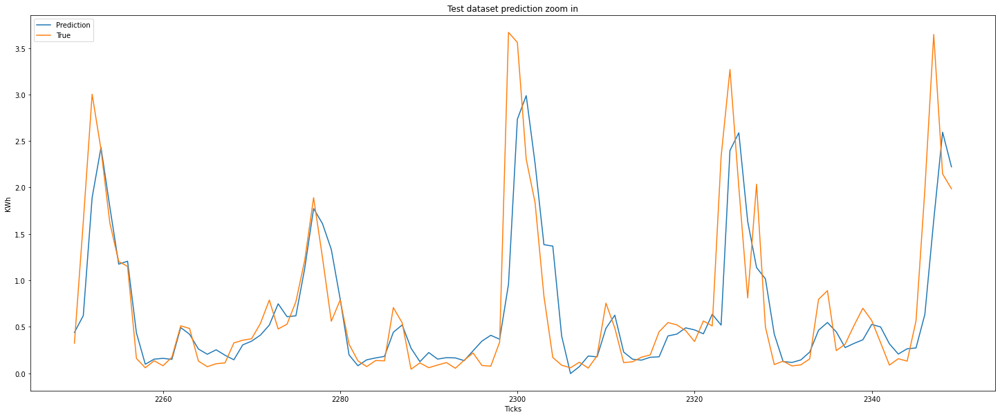

In [118]:
plt.plot(weather_energy.index[2250:2350], predictions_svr[250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [124]:
test_score_svr = mean_squared_error(y_test[1], predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

NameError: name 'predictions_svr' is not defined

In [ ]:
r2_score(y_test[1], predictions_svr)

In [ ]:
mda(np.asarray(y_test[1]), pred_xg)

In [ ]:
test_score_mae = mean_absolute_error(y_test[1], predictions_svr)
print('Test MAE: %.3f' % test_score_mae)

### No outliers in train data

In [104]:
svr_fit = svm.NuSVR(kernel='poly', degree = 3,C = 100, nu = 0.7).fit(X_train_no_out, y_train_no_out)
svrscore = svr_fit.score(X_train_no_out, y_train_no_out)
print(svrscore)

0.6216906088498024


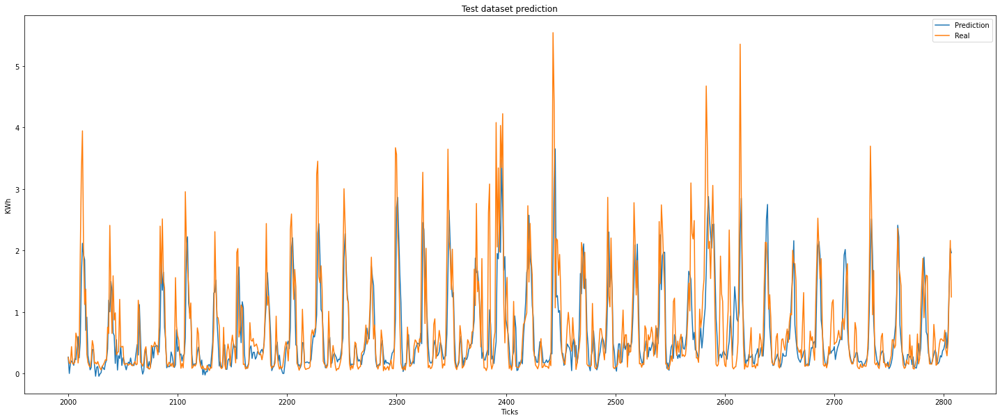

In [105]:
predictions_svr = svr_fit.predict(X_test)
plt.plot(weather_energy.index[2000:], predictions_svr, label = 'Prediction')
plt.plot(weather_energy.index[2000:],y_test, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [125]:
test_score_svr = mean_squared_error(y_test, predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.327


In [126]:
r2_score(y_test, predictions_svr)

0.5356786286582178

In [127]:
mda(np.asarray(y_test), predictions_svr)

0.4995462565009697

In [128]:
test_score_mae = mean_absolute_error(y_test, predictions_svr)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.335


### No outliers in all data

In [138]:
svr_fit = svm.NuSVR(kernel='poly', degree = 3,C = 100, nu = 0.7).fit(X_train_filt, y_train_filt)
svrscore = svr_fit.score(X_train_filt, y_train_filt)
print(svrscore)

0.6834396494303476


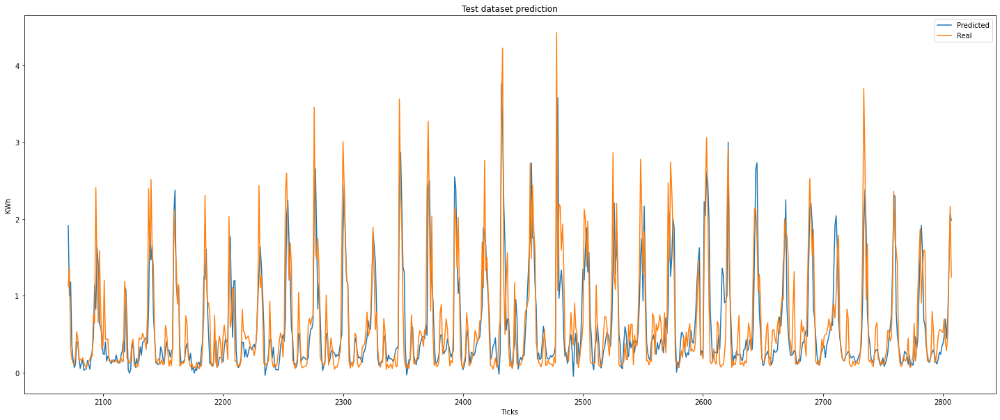

In [141]:
predictions_svr = svr_fit.predict(X_test_filt)
plt.plot(weather_energy.index[2071:], predictions_svr, label = 'Predicted')
plt.plot(weather_energy.index[2071:],y_test_filt, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [142]:
test_score_svr = mean_squared_error(y_test_filt, predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.183


In [143]:
r2_score(y_test_filt, predictions_svr)

0.6295330516528382

In [144]:
mda(np.asarray(y_test_filt), predictions_svr)

0.5747282608695652

In [145]:
test_score_mae = mean_absolute_error(y_test_filt, predictions_svr)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.275


## GPR

In [117]:
kernels_gpr = kernels.RBF(length_scale = 0.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2) 
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train[1], y_train[1])
gprscore = gpr.score(X_train[1], y_train[1])
print(gprscore)

0.6698596776038022


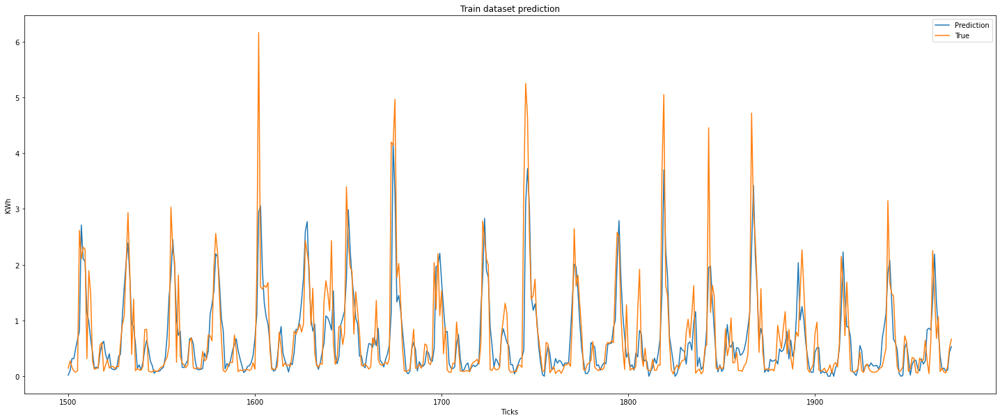

In [96]:
predictions_gpr_tr = gpr.predict(X_train[1], return_std = True)
for i in range(len(predictions_gpr_tr[0])):
    if predictions_gpr_tr[0][i] < 0:
        predictions_gpr_tr[0][i] = 0
plt.plot(weather_energy.index[2085:2647], predictions_gpr_tr[0][1500:1974], label = 'Prediction')
plt.plot(weather_energy.index[1500:1974],y_train[1500:1974], label = 'True')
#plt.fill_between(weather_energy.index[:2000], predictions_gpr_tr[0].flatten() + predictions_gpr_tr[1], predictions_gpr_tr[0].flatten() - predictions_gpr_tr[1], color='g', alpha=0.2)
plt.title('Train dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

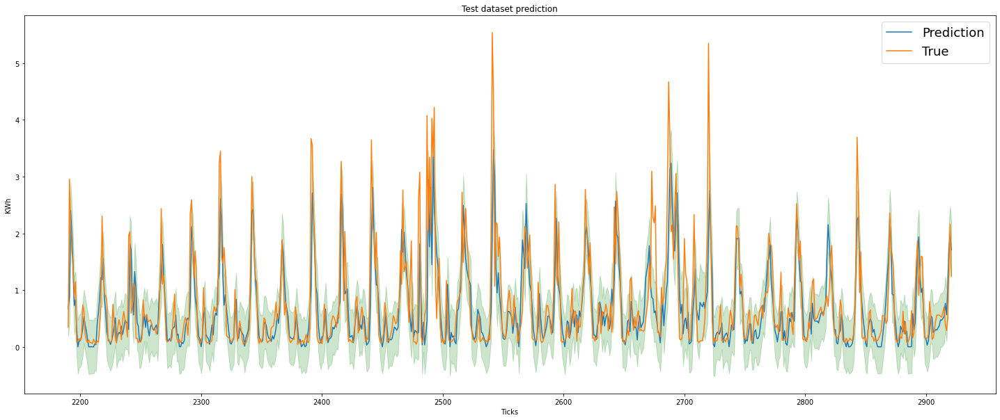

In [118]:
plt.figure(figsize = (25,10))
predictions_gpr = gpr.predict(X_test[1], return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.plot(weather_energy.index[2085:2787], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2085:2787],y_test[1], label = 'True')
plt.fill_between(weather_energy.index[2085:2787], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend(fontsize = 18)

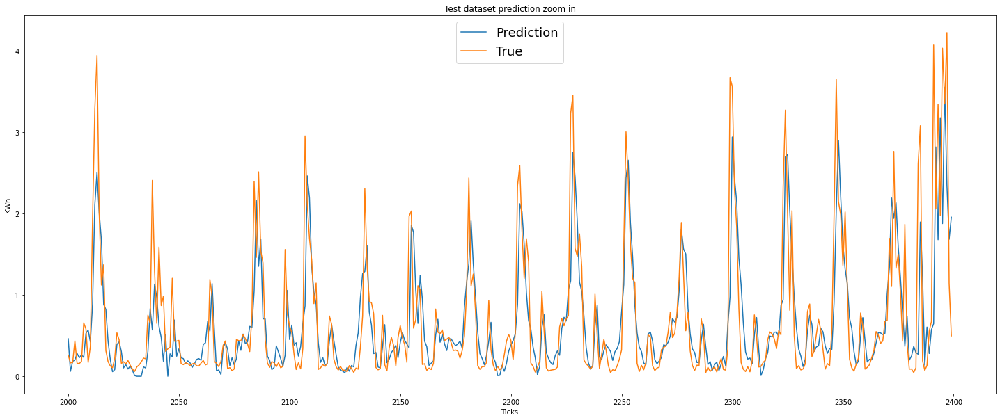

In [142]:
plt.plot(weather_energy.index[2000:2400], predictions_gpr[0][0:400], label = 'Prediction')
plt.plot(weather_energy.index[2000:2400],y_test[:400], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend(fontsize = 18)

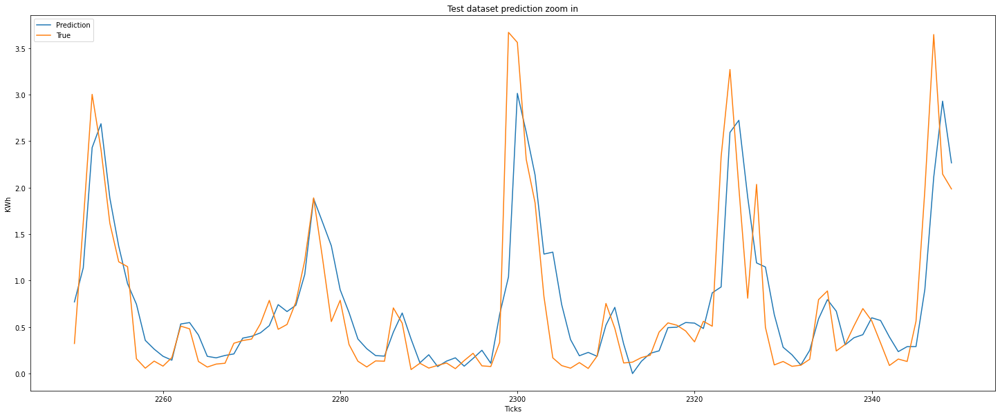

In [160]:
plt.plot(weather_energy.index[2250:2350], predictions_gpr[0][250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [119]:
test_score = mean_squared_error(y_test[1], predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.312


In [120]:
r2_score(y_test[1], predictions_gpr[0])

0.573180498933727

In [121]:
mda(np.asarray(y_test[1]), predictions_gpr[0])

0.6034236804564908

In [122]:
test_score_mae = mean_absolute_error(y_test[1], predictions_gpr[0])
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.341


### No outliers in train data

In [464]:
kernels_gpr = kernels.RBF(length_scale = 0.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2) 
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train_no_out[1], y_train_no_out[1])
gprscore = gpr.score(X_train_no_out[1], y_train_no_out[1])
print(gprscore)

0.7492627873065716


In [465]:
len(X_train_no_out[1])

2085

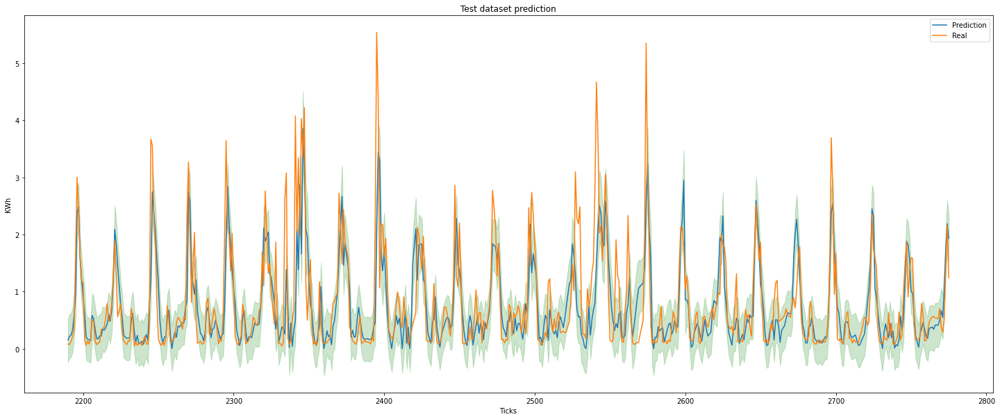

In [466]:
predictions_gpr = gpr.predict(X_test[1], return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.plot(weather_energy.index[2085:2647], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2085:2647],y_test[1], label = 'Real')
plt.fill_between(weather_energy.index[2085:2647], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [467]:
test_score = mean_squared_error(y_test[1], predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.348


In [468]:
r2_score(y_test[1], predictions_gpr[0])

0.5574681723181882

In [469]:
mda(np.asarray(y_test[1]), predictions_gpr[0])

0.4988863151807474

In [470]:
test_score_mae = mean_absolute_error(y_test[1], predictions_gpr[0])
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.361


### No outliers in all data

In [171]:
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train_filt, y_train_filt)
gprscore = gpr.score(X_train_filt, y_train_filt)
print(gprscore)

0.7421691534538355


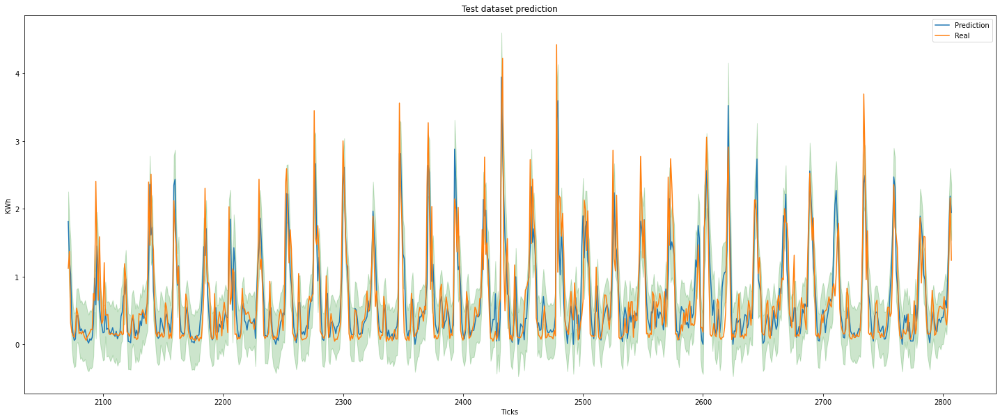

In [172]:
predictions_gpr = gpr.predict(X_test_filt, return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.plot(weather_energy.index[2071:], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2071:],y_test_filt, label = 'Real')
plt.fill_between(weather_energy.index[2071:], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [173]:
test_score = mean_squared_error(y_test_filt, predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.162


In [174]:
r2_score(y_test_filt, predictions_gpr[0])

0.6728373833323311

In [175]:
mda(np.asarray(y_test_filt), predictions_gpr[0])

0.6046195652173914

In [176]:
test_score_mae = mean_absolute_error(y_test_filt, predictions_gpr[0])
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.271


## XGBoost

In [317]:
model = XGBRegressor(objective='reg:squarederror', n_estimators=500, min_child_weight=0.8, max_depth= 8, learning_rate= 0.05, gamma= 0.9)

In [318]:
model.fit(X_train[1], y_train[1])

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0.9, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.05, max_delta_step=0,
             max_depth=8, min_child_weight=0.8, missing=nan,
             monotone_constraints='()', n_estimators=500, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [319]:
pred_xg = model.predict(X_test[1])

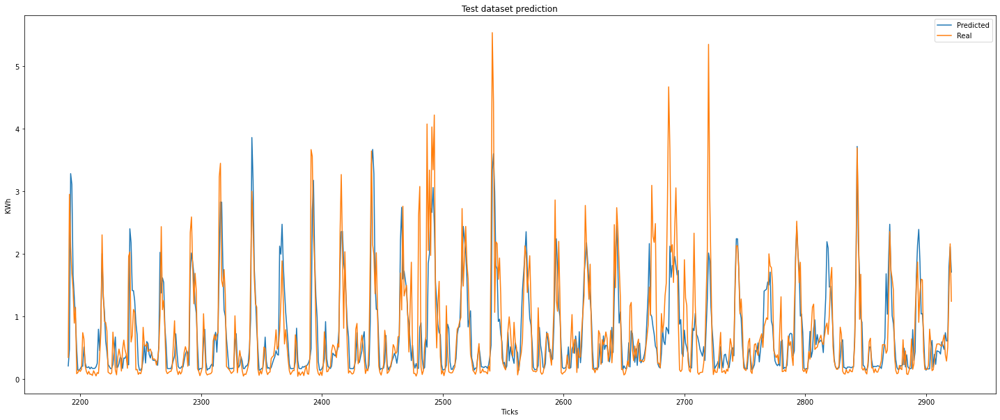

In [320]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2085:2787], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2085:2787],y_test[1], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

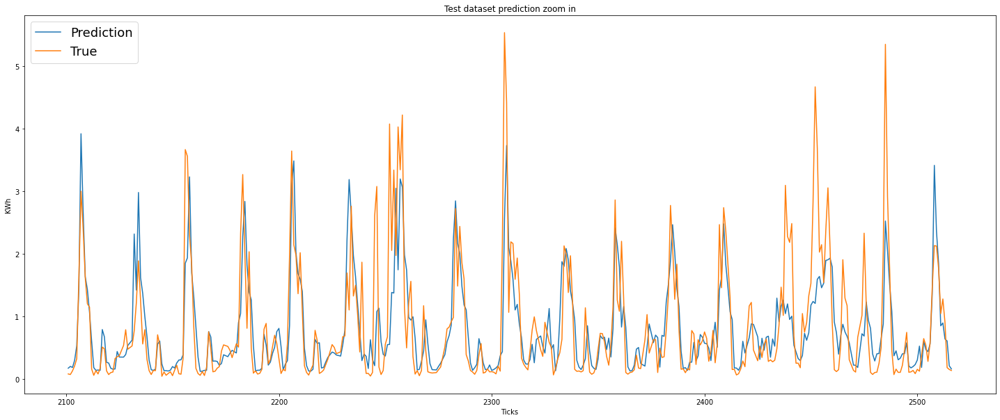

In [441]:
plt.plot(weather_energy.index[2000:2400], pred_xg[:400], label = 'Prediction')
plt.plot(weather_energy.index[2000:2400],y_test[1][:400], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend(fontsize = 18)

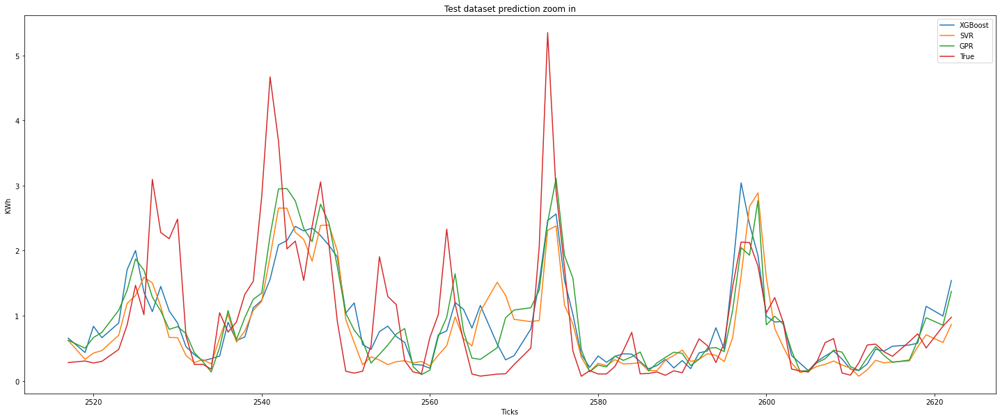

In [274]:
plt.plot(weather_energy.index[2400:2500], pred_xg[315:415], label = 'XGBoost')
plt.plot(weather_energy.index[2400:2500], predictions_svr[315:415], label = 'SVR')
plt.plot(weather_energy.index[2400:2500], predictions_gpr[0][315:415], label = 'GPR')
plt.plot(weather_energy.index[2400:2500],y_test[1][315:415], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [321]:
test_score = mean_squared_error(y_test[1], pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.319


In [322]:
r2_score(y_test[1], pred_xg)

0.5641013742916485

In [323]:
mda(np.asarray(y_test[1]), pred_xg)

0.48950042836705665

In [324]:
test_score_mae = mean_absolute_error(y_test[1], pred_xg)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.334


### No outliers in train data

In [567]:
model.fit(X_train_no_out[1], y_train_no_out[1])

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0.6, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.03, max_delta_step=0,
             max_depth=5, min_child_weight=0.5, missing=nan,
             monotone_constraints='()', n_estimators=500, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [568]:
pred_xg = model.predict(X_test[1])

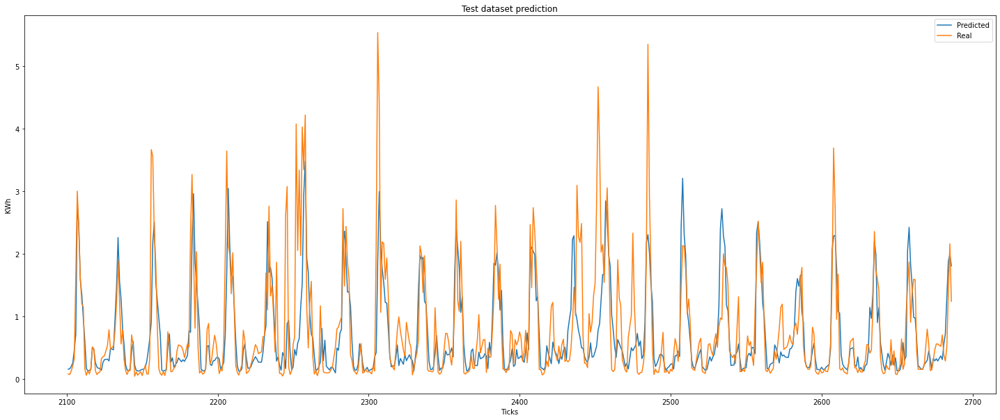

In [569]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2000:2562], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2000:2562],y_test[1], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

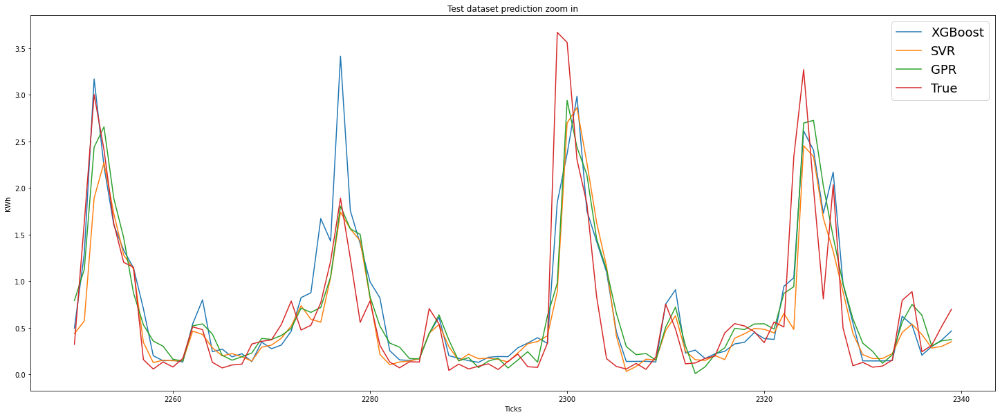

In [136]:
plt.plot(weather_energy.index[2250:2340], pred_xg[250:340], label = 'XGBoost')
plt.plot(weather_energy.index[2250:2340], predictions_svr[250:340], label = 'SVR')
plt.plot(weather_energy.index[2250:2340], predictions_gpr[0][250:340], label = 'GPR')
plt.plot(weather_energy.index[2250:2340],y_test[250:340], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend(fontsize = 18)

In [570]:
test_score = mean_squared_error(y_test[1], pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.392


In [571]:
r2_score(y_test[1], pred_xg)

0.5014876047925407

In [572]:
mda(np.asarray(y_test[1]), pred_xg)

0.4984764283285831

In [573]:
test_score_mae = mean_absolute_error(y_test[1], pred_xg)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.365


### No outliers in all data

In [235]:
model = XGBRegressor(objective='reg:squarederror', n_estimators=400, min_child_weight=0.4, max_depth= 14, learning_rate= 0.02, gamma= 0.8)

In [236]:
model.fit(X_train_filt[1], y_train_filt[1])

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0.8, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.02, max_delta_step=0,
             max_depth=14, min_child_weight=0.4, missing=nan,
             monotone_constraints='()', n_estimators=400, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [237]:
pred_xg = model.predict(X_test_filt[1])

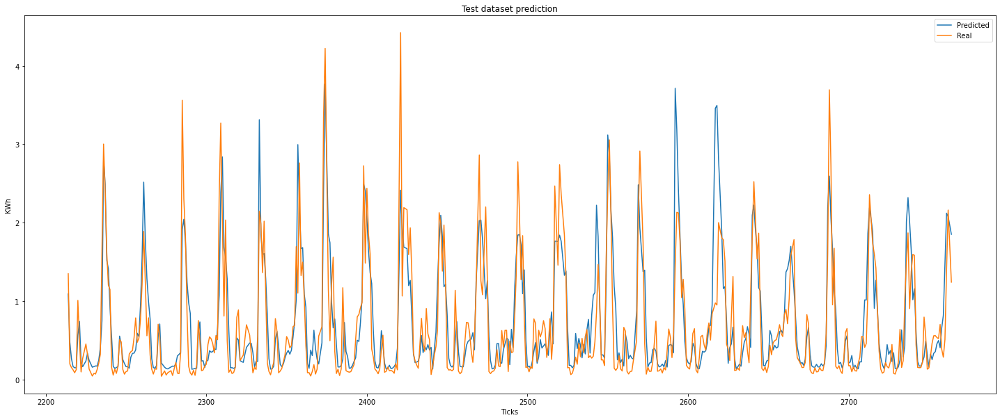

In [459]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2109:2637], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2109:2637],y_test_filt[1], label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

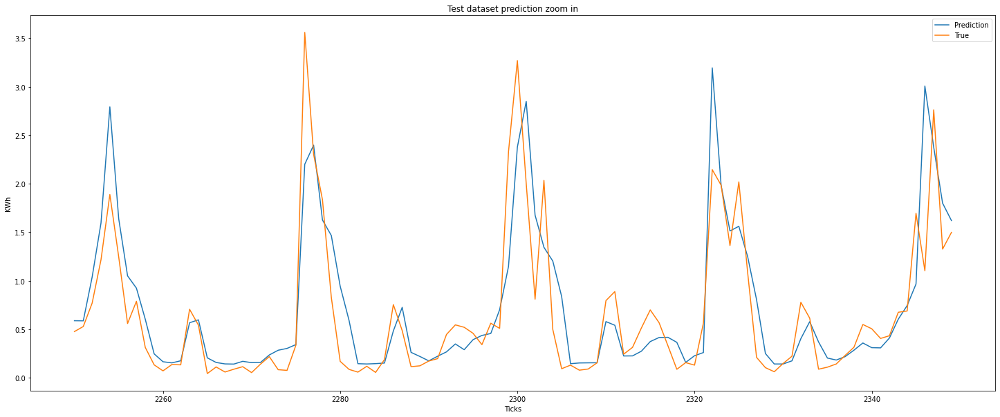

In [150]:
plt.plot(weather_energy.index[2250:2350], pred_xg[250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test_filt[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [238]:
test_score = mean_squared_error(y_test_filt[1], pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.181


In [239]:
r2_score(y_test_filt[1], pred_xg)

0.6642965631754791

In [240]:
mda(np.asarray(y_test_filt[1]), pred_xg)

0.6166982922201139

In [241]:
test_score_mae = mean_absolute_error(y_test_filt[1], pred_xg)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.271
